# NBA MVP Prediction Model

#### <div class="alert alert-block alert-success">Objective: Predict the NBA MVP of the most recent year in the data, which is season 2022, by predicting the Award Share score. The highest award share score is the MVP winner. You can think of the award share scoring as the total of how many first place (10 points), second place (7 points), third place (5 points), fourth place (3 points) and fifth place (1 point) votes each player recieves.

## Table of contents
1. [Data Load & Cleaning](#dataload)
2. [Data Analysis](#dataanalysis)
3. [Feature Engineering & Data Prep for Model Development](#feateng)
    1. [Univariate Feature Analysis](#unifeat)
    2. [Final Dataframes for Model Input](#dataframes)
4. [Model Development on Training Data & Predict on Test Data](#modelpredict)
    1. [Regression Model Comparisons on Train Data](#modelpredict)
    2. [Random Forest](#rfr_traintest)
    3. [Extra Trees Regressor](#etr_traintest)
    4. [XGBoost Regressor](#lgbm_traintest)
    5. [CatBoost Regressor](#cat_traintest)
5. [Validate ML Model on Validation Data](#val)
    1. [Random Forest](#rfc_val)
    2. [Extra Trees Regressor](#et_val)
    3. [XGBoost Regressor](#lgbm_val)
6. [Voting Regressor Try](#vote)
7.[Conclusion](#con)
    1. [Feature Influence & Analysis](#featinflu)
    2. [Learning Curve Plot](#lc)

In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:75% !important; }</style>"))

In [2]:
# Import Libs
import numpy as np
import pandas as pd
import seaborn as sns
import time
from time import *
from time import time
np.random.seed(42)

# ML Model Imports
from sklearn.linear_model import LinearRegression, Ridge,Lasso, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor, RandomForestRegressor, VotingRegressor
from sklearn.tree import DecisionTreeRegressor
import xgboost as xgb
from sklearn.svm import SVR
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

# Tools Import
from sklearn.inspection import permutation_importance
from sklearn.model_selection import cross_val_score, GridSearchCV, ParameterGrid, RandomizedSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder 
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.model_selection import learning_curve

# Metrics Import
from sklearn.metrics import explained_variance_score,mean_absolute_error,r2_score, mean_squared_error

In [3]:
# Show all Columns

pd.set_option('max_columns', None)

In [4]:
# Plot format standardization

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams['figure.figsize'] = 14, 7
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

In [5]:
import warnings
warnings.filterwarnings("ignore")

### Data Loading & Cleaning <a name='dataload'></a>

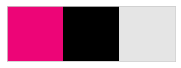

In [6]:
sns.set_style("whitegrid", {'axes.grid': False})

panda_black = "#000000"
pink_punk = '#ed0577'
happy_grey = '#e5e5e5'

hpp_palette = [pink_punk, panda_black, happy_grey]
sns.set_palette(hpp_palette)
sns.palplot(sns.color_palette(hpp_palette))

In [7]:
def completeness_ratio(df):

    # Plot ratio of null values only for columns with null values
        
    percent = df.count() / len(df.index)
    percent = percent[percent < 1]
    percent.sort_values(inplace=True)
    complete = pd.Series(1, index=percent.index)

    fig = plt.figure(figsize=(18, 8))
    ax = plt.axes()

    sns.barplot(complete.index, complete, color=happy_grey, 
                saturation=1, linewidth=0, ax=ax, label='Null')

    sns.barplot(percent.index, percent, color=pink_punk, 
                saturation=1, linewidth=0, ax=ax, label='Not Null')
    
    plt.xticks(rotation=90)
    
    plt.legend(ncol=2)
    
    sns.despine()

In [8]:
# Import data into dataframe
df = pd.read_csv('NBA_Dataset.csv')
df

,season,player,pos,age,team_id,g,gs,mp_per_g,fg_per_g,fga_per_g,fg_pct,fg3_per_g,fg3a_per_g,fg3_pct,fg2_per_g,fg2a_per_g,fg2_pct,efg_pct,ft_per_g,fta_per_g,ft_pct,orb_per_g,drb_per_g,trb_per_g,ast_per_g,stl_per_g,blk_per_g,tov_per_g,pf_per_g,pts_per_g,mp,per,ts_pct,fg3a_per_fga_pct,fta_per_fga_pct,orb_pct,drb_pct,trb_pct,ast_pct,stl_pct,blk_pct,tov_pct,usg_pct,ows,dws,ws,ws_per_48,obpm,dbpm,bpm,vorp,award_share,mov,mov_adj,win_loss_pct
0,1982,Kareem Abdul-Jabbar,C,34,LAL,76,76,35.2,9.9,17.1,0.579,0.0,0.0,0.000,9.9,17.1,0.580,0.579,4.1,5.8,0.706,2.3,6.4,8.7,3.0,0.8,2.7,3.0,2.9,23.9,2677,23.4,0.608,0.002,0.340,7.3,19.1,13.4,11.9,1.1,4.1,13.3,25.6,6.9,3.9,10.7,0.192,3.8,1.2,5.0,4.7,0.045,4.87,4.37,0.695
1,1982,Alvan Adams,C,27,PHO,79,75,30.3,6.4,13.0,0.494,0.0,0.0,0.000,6.4,13.0,0.494,0.494,2.3,2.9,0.781,1.7,5.7,7.4,4.5,1.4,1.0,2.5,3.4,15.1,2393,18.6,0.529,0.001,0.227,6.6,20.2,13.6,22.1,2.3,1.9,14.8,22.8,2.5,4.7,7.2,0.144,1.4,2.2,3.6,3.4,0.000,3.45,3.05,0.561
2,1982,Mark Aguirre,SF,22,DAL,51,20,28.8,7.5,16.1,0.465,0.5,1.4,0.352,7.0,14.7,0.475,0.480,3.3,4.8,0.680,1.7,3.1,4.9,3.2,0.7,0.4,2.6,3.0,18.7,1468,17.3,0.514,0.087,0.301,6.7,12.9,9.7,18.6,1.2,0.9,12.7,29.8,1.0,0.8,1.9,0.061,2.3,-1.6,0.7,1.0,0.000,-4.43,-4.48,0.341
3,1982,Danny Ainge,SG,22,BOS,53,1,10.6,1.5,4.2,0.357,0.1,0.3,0.294,1.4,3.8,0.363,0.369,1.1,1.2,0.862,0.5,0.6,1.1,1.6,0.7,0.1,1.0,1.6,4.1,564,10.1,0.439,0.077,0.294,5.0,5.9,5.5,19.7,3.1,0.3,17.5,21.5,-0.3,0.8,0.5,0.042,-3.7,1.0,-2.7,-0.1,0.000,6.38,6.35,0.768
4,1982,Tiny Archibald,PG,33,BOS,68,51,31.9,4.5,9.6,0.472,0.1,0.2,0.375,4.4,9.4,0.475,0.477,3.5,4.6,0.747,0.4,1.3,1.7,8.0,0.8,0.0,2.6,1.9,12.6,2167,14.3,0.542,0.025,0.485,1.3,4.5,2.9,31.9,1.1,0.1,18.4,17.9,3.4,1.8,5.2,0.115,1.4,-1.3,0.1,1.1,0.000,6.38,6.35,0.768
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17692,2022,Thaddeus Young,PF,33,TOT,52,1,16.3,2.7,5.2,0.518,0.3,0.9,0.354,2.4,4.3,0.554,0.550,0.4,0.9,0.469,1.5,2.5,4.0,2.0,1.0,0.3,1.0,1.6,6.2,845,17.0,0.548,0.176,0.180,9.8,16.8,13.1,17.7,3.1,2.0,15.0,17.4,0.9,1.3,2.2,0.126,0.1,2.1,2.2,0.9,0.000,0.00,0.00,0.500
17693,2022,Trae Young,PG,23,ATL,76,76,34.9,9.4,20.3,0.460,3.1,8.0,0.382,6.3,12.3,0.512,0.536,6.6,7.3,0.904,0.7,3.1,3.7,9.7,0.9,0.1,4.0,1.7,28.4,2652,25.4,0.603,0.395,0.358,2.1,9.6,5.9,46.7,1.3,0.2,14.5,34.4,9.0,1.0,10.0,0.181,7.1,-2.0,5.2,4.8,0.000,1.56,1.55,0.524
17694,2022,Omer Yurtseven,C,23,MIA,56,12,12.6,2.3,4.4,0.526,0.0,0.2,0.091,2.3,4.2,0.547,0.528,0.7,1.1,0.623,1.5,3.7,5.3,0.9,0.3,0.4,0.7,1.5,5.3,706,17.4,0.546,0.045,0.247,13.9,33.0,23.6,11.0,1.2,3.0,13.0,19.9,0.8,1.4,2.1,0.145,-1.4,0.4,-1.0,0.2,0.000,4.45,4.23,0.646
17695,2022,Cody Zeller,C,29,POR,27,0,13.1,1.9,3.3,0.567,0.0,0.1,0.000,1.9,3.2,0.593,0.567,1.4,1.8,0.776,1.9,2.8,4.6,0.8,0.3,0.2,0.7,2.1,5.2,355,17.2,0.627,0.044,0.544,14.9,24.1,19.3,9.4,1.1,1.7,14.6,15.9,0.9,0.2,1.1,0.143,-1.2,-1.0,-2.1,0.0,0.000,-8.88,-8.55,0.329


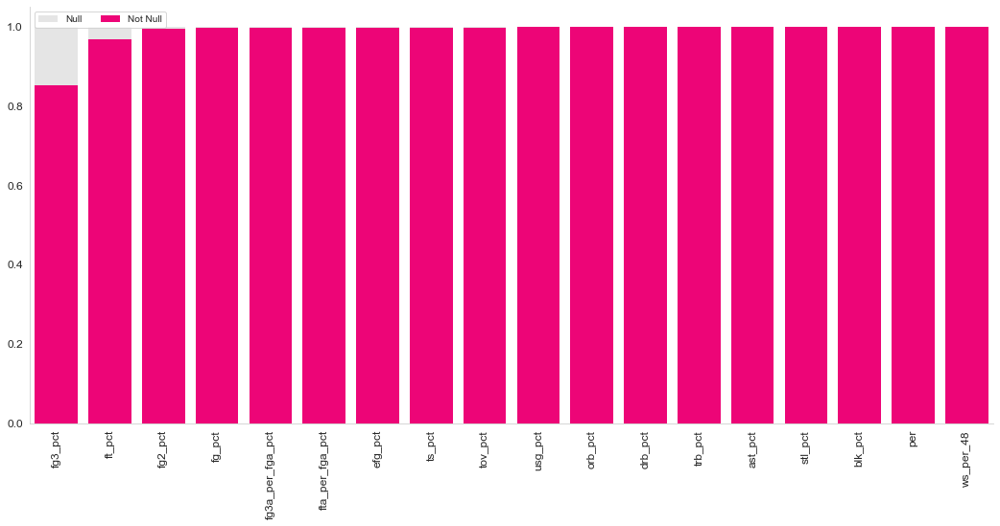

In [9]:
completeness_ratio(df)

<AxesSubplot:>

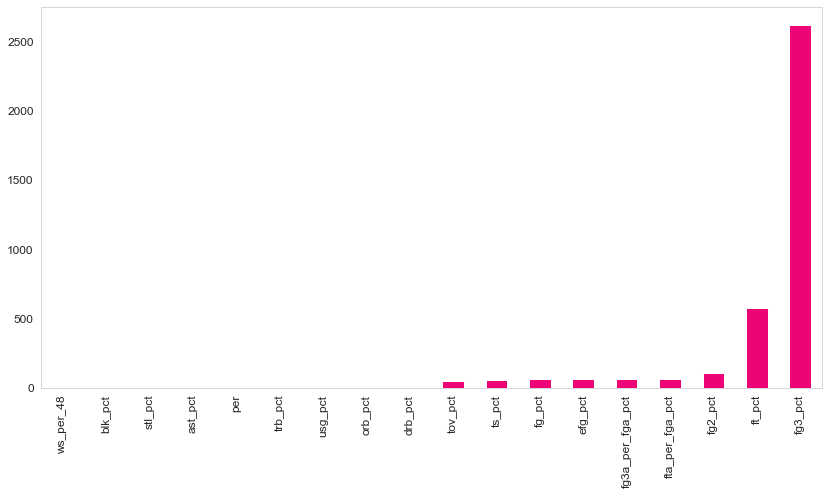

In [10]:
missing = df.isnull().sum()
missing = missing[missing > 0]
missing.sort_values(inplace=True)
missing.plot.bar()

In [11]:
# Drop rows with NULL values

df = df.dropna()

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14783 entries, 0 to 17695
Data columns (total 55 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   season            14783 non-null  int64  
 1   player            14783 non-null  object 
 2   pos               14783 non-null  object 
 3   age               14783 non-null  int64  
 4   team_id           14783 non-null  object 
 5   g                 14783 non-null  int64  
 6   gs                14783 non-null  int64  
 7   mp_per_g          14783 non-null  float64
 8   fg_per_g          14783 non-null  float64
 9   fga_per_g         14783 non-null  float64
 10  fg_pct            14783 non-null  float64
 11  fg3_per_g         14783 non-null  float64
 12  fg3a_per_g        14783 non-null  float64
 13  fg3_pct           14783 non-null  float64
 14  fg2_per_g         14783 non-null  float64
 15  fg2a_per_g        14783 non-null  float64
 16  fg2_pct           14783 non-null  float6

Data Column Legend

https://www.basketball-reference.com/about/glossary.html

In [13]:
# This adds a column telling us who the MVP was with a binary value

mvps = df.groupby(by = 'season').max('award_share')
mvps['was_mvp'] = '1'
df = df.merge(mvps[['award_share', 'was_mvp']], on = ['season', 'award_share'], how = 'left')
df['was_mvp'] = df['was_mvp'].fillna(value = 0)

df['was_mvp'] = df['was_mvp'].astype(int)

In [14]:
# This adds a column telling us who the MVP was with a boolan value

mvps = df.groupby(by = 'season').max('award_share')
mvps['was_mvp_TF'] = True
df = df.merge(mvps[['award_share', 'was_mvp_TF']], on = ['season', 'award_share'], how = 'left')
df['was_mvp_TF'] = df['was_mvp_TF'].fillna(value = False)

In [15]:
df

,season,player,pos,age,team_id,g,gs,mp_per_g,fg_per_g,fga_per_g,fg_pct,fg3_per_g,fg3a_per_g,fg3_pct,fg2_per_g,fg2a_per_g,fg2_pct,efg_pct,ft_per_g,fta_per_g,ft_pct,orb_per_g,drb_per_g,trb_per_g,ast_per_g,stl_per_g,blk_per_g,tov_per_g,pf_per_g,pts_per_g,mp,per,ts_pct,fg3a_per_fga_pct,fta_per_fga_pct,orb_pct,drb_pct,trb_pct,ast_pct,stl_pct,blk_pct,tov_pct,usg_pct,ows,dws,ws,ws_per_48,obpm,dbpm,bpm,vorp,award_share,mov,mov_adj,win_loss_pct,was_mvp,was_mvp_TF
0,1982,Kareem Abdul-Jabbar,C,34,LAL,76,76,35.2,9.9,17.1,0.579,0.0,0.0,0.000,9.9,17.1,0.580,0.579,4.1,5.8,0.706,2.3,6.4,8.7,3.0,0.8,2.7,3.0,2.9,23.9,2677,23.4,0.608,0.002,0.340,7.3,19.1,13.4,11.9,1.1,4.1,13.3,25.6,6.9,3.9,10.7,0.192,3.8,1.2,5.0,4.7,0.045,4.87,4.37,0.695,0,False
1,1982,Alvan Adams,C,27,PHO,79,75,30.3,6.4,13.0,0.494,0.0,0.0,0.000,6.4,13.0,0.494,0.494,2.3,2.9,0.781,1.7,5.7,7.4,4.5,1.4,1.0,2.5,3.4,15.1,2393,18.6,0.529,0.001,0.227,6.6,20.2,13.6,22.1,2.3,1.9,14.8,22.8,2.5,4.7,7.2,0.144,1.4,2.2,3.6,3.4,0.000,3.45,3.05,0.561,0,False
2,1982,Mark Aguirre,SF,22,DAL,51,20,28.8,7.5,16.1,0.465,0.5,1.4,0.352,7.0,14.7,0.475,0.480,3.3,4.8,0.680,1.7,3.1,4.9,3.2,0.7,0.4,2.6,3.0,18.7,1468,17.3,0.514,0.087,0.301,6.7,12.9,9.7,18.6,1.2,0.9,12.7,29.8,1.0,0.8,1.9,0.061,2.3,-1.6,0.7,1.0,0.000,-4.43,-4.48,0.341,0,False
3,1982,Danny Ainge,SG,22,BOS,53,1,10.6,1.5,4.2,0.357,0.1,0.3,0.294,1.4,3.8,0.363,0.369,1.1,1.2,0.862,0.5,0.6,1.1,1.6,0.7,0.1,1.0,1.6,4.1,564,10.1,0.439,0.077,0.294,5.0,5.9,5.5,19.7,3.1,0.3,17.5,21.5,-0.3,0.8,0.5,0.042,-3.7,1.0,-2.7,-0.1,0.000,6.38,6.35,0.768,0,False
4,1982,Tiny Archibald,PG,33,BOS,68,51,31.9,4.5,9.6,0.472,0.1,0.2,0.375,4.4,9.4,0.475,0.477,3.5,4.6,0.747,0.4,1.3,1.7,8.0,0.8,0.0,2.6,1.9,12.6,2167,14.3,0.542,0.025,0.485,1.3,4.5,2.9,31.9,1.1,0.1,18.4,17.9,3.4,1.8,5.2,0.115,1.4,-1.3,0.1,1.1,0.000,6.38,6.35,0.768,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14778,2022,Gabe York,SG,28,IND,2,0,10.5,1.0,3.5,0.286,0.5,3.0,0.167,0.5,0.5,1.000,0.357,1.5,2.5,0.600,0.0,1.0,1.0,2.0,1.0,0.5,0.5,2.0,4.0,21,12.7,0.435,0.857,0.714,0.0,10.8,5.3,25.1,4.7,4.1,9.8,20.8,0.0,0.0,0.0,0.059,-3.7,2.2,-1.5,0.0,0.000,-3.48,-3.26,0.305,0,False
14779,2022,Thaddeus Young,PF,33,TOT,52,1,16.3,2.7,5.2,0.518,0.3,0.9,0.354,2.4,4.3,0.554,0.550,0.4,0.9,0.469,1.5,2.5,4.0,2.0,1.0,0.3,1.0,1.6,6.2,845,17.0,0.548,0.176,0.180,9.8,16.8,13.1,17.7,3.1,2.0,15.0,17.4,0.9,1.3,2.2,0.126,0.1,2.1,2.2,0.9,0.000,0.00,0.00,0.500,0,False
14780,2022,Trae Young,PG,23,ATL,76,76,34.9,9.4,20.3,0.460,3.1,8.0,0.382,6.3,12.3,0.512,0.536,6.6,7.3,0.904,0.7,3.1,3.7,9.7,0.9,0.1,4.0,1.7,28.4,2652,25.4,0.603,0.395,0.358,2.1,9.6,5.9,46.7,1.3,0.2,14.5,34.4,9.0,1.0,10.0,0.181,7.1,-2.0,5.2,4.8,0.000,1.56,1.55,0.524,0,False
14781,2022,Omer Yurtseven,C,23,MIA,56,12,12.6,2.3,4.4,0.526,0.0,0.2,0.091,2.3,4.2,0.547,0.528,0.7,1.1,0.623,1.5,3.7,5.3,0.9,0.3,0.4,0.7,1.5,5.3,706,17.4,0.546,0.045,0.247,13.9,33.0,23.6,11.0,1.2,3.0,13.0,19.9,0.8,1.4,2.1,0.145,-1.4,0.4,-1.0,0.2,0.000,4.45,4.23,0.646,0,False


In [16]:
# Add MVP Ranking by Season

df['was_mpv_rank'] = df.groupby('season')['award_share'].rank(method='max',ascending=False)
df['was_mpv_rank'] = df['was_mpv_rank'].astype(int)
df = df.sort_values(['season','was_mpv_rank'], ascending=True).reset_index(drop=True)
df

,season,player,pos,age,team_id,g,gs,mp_per_g,fg_per_g,fga_per_g,fg_pct,fg3_per_g,fg3a_per_g,fg3_pct,fg2_per_g,fg2a_per_g,fg2_pct,efg_pct,ft_per_g,fta_per_g,ft_pct,orb_per_g,drb_per_g,trb_per_g,ast_per_g,stl_per_g,blk_per_g,tov_per_g,pf_per_g,pts_per_g,mp,per,ts_pct,fg3a_per_fga_pct,fta_per_fga_pct,orb_pct,drb_pct,trb_pct,ast_pct,stl_pct,blk_pct,tov_pct,usg_pct,ows,dws,ws,ws_per_48,obpm,dbpm,bpm,vorp,award_share,mov,mov_adj,win_loss_pct,was_mvp,was_mvp_TF,was_mpv_rank
0,1982,Moses Malone,C,26,HOU,81,81,42.0,11.7,22.5,0.519,0.0,0.1,0.000,11.7,22.4,0.520,0.519,7.8,10.2,0.762,6.9,7.8,14.7,1.8,0.9,1.5,3.6,2.6,31.1,3398,26.8,0.576,0.003,0.454,17.5,21.2,19.3,6.9,1.1,2.1,11.9,29.9,11.7,3.7,15.4,0.218,6.2,-1.8,4.5,5.5,0.735,-0.04,-0.39,0.561,1,True,1
1,1982,Larry Bird,PF,25,BOS,77,58,38.0,9.2,18.4,0.503,0.1,0.7,0.212,9.1,17.7,0.514,0.507,4.3,4.9,0.863,2.6,8.3,10.9,5.8,1.9,0.9,3.3,3.2,22.9,2923,22.6,0.557,0.037,0.269,7.7,23.4,15.8,22.5,2.3,1.2,13.8,25.2,6.8,5.7,12.5,0.205,4.4,2.3,6.6,6.4,0.588,6.38,6.35,0.768,0,False,2
2,1982,Julius Erving,SF,31,PHI,81,81,34.4,9.6,17.6,0.546,0.0,0.1,0.273,9.6,17.5,0.548,0.547,5.1,6.7,0.763,2.7,4.2,6.9,3.9,2.0,1.7,2.6,2.8,24.4,2789,25.9,0.593,0.008,0.377,9.3,13.0,11.2,18.1,2.8,2.9,11.4,28.1,8.7,4.6,13.3,0.229,6.0,1.7,7.7,6.8,0.294,5.73,5.74,0.707,0,False,3
3,1982,Gus Williams,PG,28,SEA,80,80,36.0,9.7,19.9,0.486,0.1,0.5,0.225,9.6,19.4,0.492,0.488,4.0,5.5,0.734,1.2,1.9,3.1,6.9,2.2,0.5,2.5,2.0,23.4,2876,21.8,0.526,0.025,0.274,3.6,5.5,4.6,31.0,2.9,0.7,9.9,28.5,5.9,4.3,10.2,0.171,4.1,1.0,5.1,5.2,0.167,4.13,3.69,0.634,0,False,4
4,1982,George Gervin,SG,29,SAS,79,79,35.7,12.6,25.2,0.500,0.1,0.5,0.278,12.4,24.7,0.504,0.502,7.0,8.1,0.864,1.7,3.2,5.0,2.4,1.0,0.6,2.7,2.7,32.3,2817,24.2,0.562,0.018,0.323,5.2,9.7,7.5,11.4,1.3,0.9,8.5,35.0,8.7,2.0,10.7,0.182,5.4,-1.5,3.9,4.2,0.159,2.30,1.79,0.585,0,False,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14778,2022,Gabe York,SG,28,IND,2,0,10.5,1.0,3.5,0.286,0.5,3.0,0.167,0.5,0.5,1.000,0.357,1.5,2.5,0.600,0.0,1.0,1.0,2.0,1.0,0.5,0.5,2.0,4.0,21,12.7,0.435,0.857,0.714,0.0,10.8,5.3,25.1,4.7,4.1,9.8,20.8,0.0,0.0,0.0,0.059,-3.7,2.2,-1.5,0.0,0.000,-3.48,-3.26,0.305,0,False,520
14779,2022,Thaddeus Young,PF,33,TOT,52,1,16.3,2.7,5.2,0.518,0.3,0.9,0.354,2.4,4.3,0.554,0.550,0.4,0.9,0.469,1.5,2.5,4.0,2.0,1.0,0.3,1.0,1.6,6.2,845,17.0,0.548,0.176,0.180,9.8,16.8,13.1,17.7,3.1,2.0,15.0,17.4,0.9,1.3,2.2,0.126,0.1,2.1,2.2,0.9,0.000,0.00,0.00,0.500,0,False,520
14780,2022,Trae Young,PG,23,ATL,76,76,34.9,9.4,20.3,0.460,3.1,8.0,0.382,6.3,12.3,0.512,0.536,6.6,7.3,0.904,0.7,3.1,3.7,9.7,0.9,0.1,4.0,1.7,28.4,2652,25.4,0.603,0.395,0.358,2.1,9.6,5.9,46.7,1.3,0.2,14.5,34.4,9.0,1.0,10.0,0.181,7.1,-2.0,5.2,4.8,0.000,1.56,1.55,0.524,0,False,520
14781,2022,Omer Yurtseven,C,23,MIA,56,12,12.6,2.3,4.4,0.526,0.0,0.2,0.091,2.3,4.2,0.547,0.528,0.7,1.1,0.623,1.5,3.7,5.3,0.9,0.3,0.4,0.7,1.5,5.3,706,17.4,0.546,0.045,0.247,13.9,33.0,23.6,11.0,1.2,3.0,13.0,19.9,0.8,1.4,2.1,0.145,-1.4,0.4,-1.0,0.2,0.000,4.45,4.23,0.646,0,False,520


In [17]:
# Repeated Player Stats Removal. We have stats that are resulting calculations

#df = df.drop(columns = ['fg_per_g', 'fg3_per_g', 'fg2_per_g', 'ft_per_g', 'trb_per_g'], axis = 1)

### Data Analysis <a name='dataanalysis'></a>

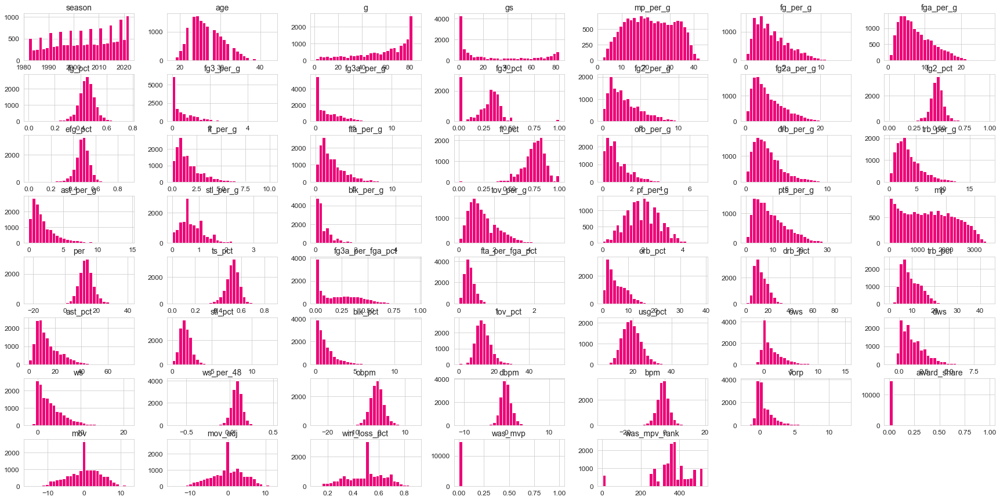

In [18]:
# overview of all numerical features
df.hist(bins=30, figsize=(30,15));

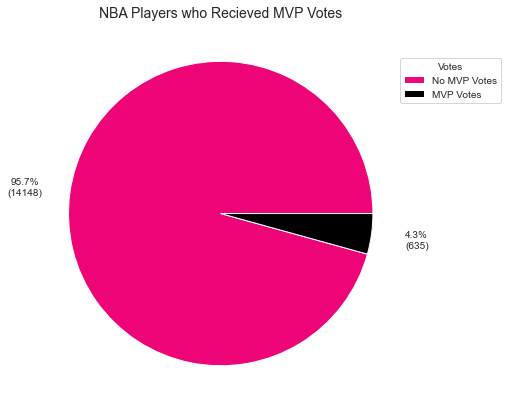

In [19]:
# MVP vs Non-MVP Distribution

from collections import Counter

classes = df["award_share"] > 0
infoDf = df[["player", "pos", "team_id"]]
dataDf = df.drop(["player", "pos", "team_id"], axis = 1)

def func(pct, allvals):
    absolute = int(np.round(pct/100.*np.sum(allvals)))
    return "{:.1f}%\n({:d})".format(pct, absolute)

fig, ax = plt.subplots()

wedges, texts, autotexts = ax.pie(classes.value_counts(), 
       autopct = lambda pct: func(pct, classes.value_counts()),
       pctdistance = 1.3)

ax.set_title("NBA Players who Recieved MVP Votes")
ax.legend(["No MVP Votes", "MVP Votes"],
          title="Votes",
          loc = 'center right',
           bbox_to_anchor=(1.25, 0.85))

plt.show()

Text(0, 0.5, 'Number of Players in the NBA')

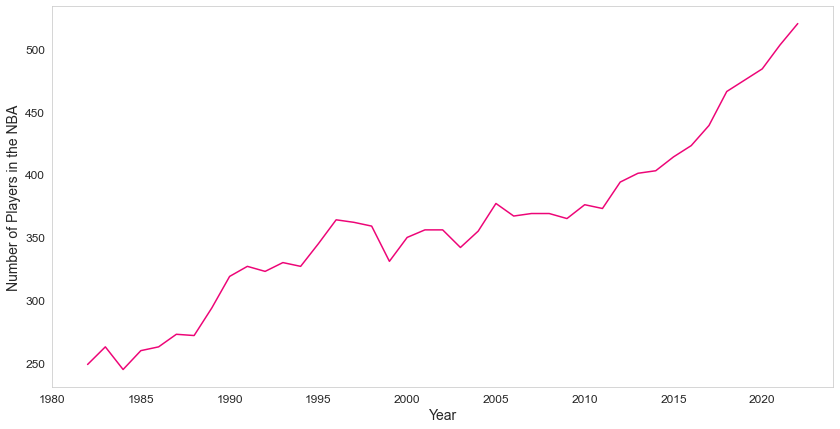

In [20]:
# Number of players in the data per season

Num_players = df['season'].value_counts().sort_index().values
years = df.season.unique()

fig, ax = plt.subplots()

ax.plot(years, Num_players)
ax.set_xlabel('Year')
ax.set_ylabel('Number of Players in the NBA')



In [21]:
# Review Top 10 MVP Vote Getters Stats

df[(df.was_mvp_TF == True) & (df.was_mpv_rank <= 10)].describe()

,season,age,g,gs,mp_per_g,fg_per_g,fga_per_g,fg_pct,fg3_per_g,fg3a_per_g,fg3_pct,fg2_per_g,fg2a_per_g,fg2_pct,efg_pct,ft_per_g,fta_per_g,ft_pct,orb_per_g,drb_per_g,trb_per_g,ast_per_g,stl_per_g,blk_per_g,tov_per_g,pf_per_g,pts_per_g,mp,per,ts_pct,fg3a_per_fga_pct,fta_per_fga_pct,orb_pct,drb_pct,trb_pct,ast_pct,stl_pct,blk_pct,tov_pct,usg_pct,ows,dws,ws,ws_per_48,obpm,dbpm,bpm,vorp,award_share,mov,mov_adj,win_loss_pct,was_mvp,was_mpv_rank
count,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.00000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.0,41.0
mean,2002.000000,27.634146,77.341463,77.195122,37.363415,9.778049,19.258537,0.509390,1.085366,2.924390,0.294171,8.707317,16.324390,0.535780,0.538195,6.358537,7.917073,0.813049,2.051220,6.843902,8.880488,6.358537,1.568293,1.078049,3.253659,2.385366,27.00000,2893.829268,28.031707,0.595951,0.155268,0.412707,6.321951,19.987805,13.417073,29.868293,2.112195,1.997561,12.736585,30.553659,10.880488,5.014634,15.895122,0.264488,7.112195,1.960976,9.078049,8.056098,0.896463,6.935854,6.678293,0.741585,1.0,1.0
std,11.979149,2.799608,6.578791,6.543010,2.548015,1.529953,2.995495,0.038114,1.133482,2.745704,0.136799,2.067413,3.971321,0.044794,0.041059,1.507975,2.039718,0.080677,1.322521,2.417235,3.409488,2.784060,0.565437,0.888119,0.583566,0.524672,3.74533,353.178560,2.910794,0.034353,0.142369,0.100377,3.628258,7.041172,4.982565,12.097798,0.736273,1.527660,2.832910,3.990996,2.382669,1.412544,2.726257,0.037462,1.628987,1.382186,2.509633,1.913903,0.086480,2.538756,2.409180,0.074390,0.0,0.0
min,1982.000000,22.000000,49.000000,49.000000,30.400000,5.700000,11.400000,0.420000,0.000000,0.000000,0.000000,4.500000,8.500000,0.441000,0.447000,2.800000,3.200000,0.524000,0.600000,2.600000,3.300000,1.300000,0.500000,0.100000,2.100000,1.400000,15.50000,1832.000000,22.000000,0.518000,0.001000,0.250000,1.800000,7.600000,5.200000,5.100000,0.600000,0.200000,7.700000,20.500000,6.100000,1.200000,9.600000,0.190000,3.500000,-1.800000,3.700000,4.000000,0.691000,-0.040000,-0.390000,0.561000,1.0,1.0
25%,1992.000000,26.000000,76.000000,76.000000,36.200000,8.800000,17.300000,0.493000,0.100000,0.500000,0.256000,7.700000,14.700000,0.506000,0.515000,5.300000,6.800000,0.767000,1.100000,4.800000,6.300000,4.300000,1.300000,0.500000,3.000000,2.100000,24.50000,2796.000000,25.600000,0.576000,0.027000,0.325000,3.500000,14.300000,9.500000,21.200000,1.700000,0.900000,11.100000,28.500000,9.500000,4.100000,14.400000,0.238000,5.900000,1.300000,7.600000,7.100000,0.857000,5.960000,5.720000,0.707000,1.0,1.0
50%,2002.000000,27.000000,80.000000,79.000000,37.600000,10.000000,19.600000,0.508000,0.900000,2.400000,0.332000,8.700000,16.200000,0.531000,0.532000,6.400000,8.100000,0.832000,1.700000,6.800000,8.000000,5.900000,1.600000,0.800000,3.200000,2.500000,27.30000,2979.000000,27.700000,0.600000,0.141000,0.429000,5.300000,20.400000,13.100000,26.300000,2.200000,1.700000,12.500000,30.500000,10.700000,4.800000,15.800000,0.270000,7.200000,2.000000,9.300000,8.000000,0.922000,7.110000,6.650000,0.756000,1.0,1.0
75%,2012.000000,29.000000,81.000000,81.000000,38.900000,10.700000,21.100000,0.530000,1.400000,4.300000,0.391000,9.700000,19.100000,0.555000,0.557000,7.600000,9.900000,0.873000,2.800000,9.000000,11.900000,7.700000,1.800000,1.200000,3.500000,2.700000,29.70000,3122.000000,30.700000,0.619000,0.241000,0.482000,8.500000,24.800000,17.800000,38.700000,2.400000,2.400000,13.800000,32.900000,12.100000,6.000000,17.800000,0.295000,8.500000,2.800000,10.900000,9.300000,0.969000,8.790000,8.210000,0.793000,1.0,1.0
max,2022.000000,35.000000,82.000000,82.00

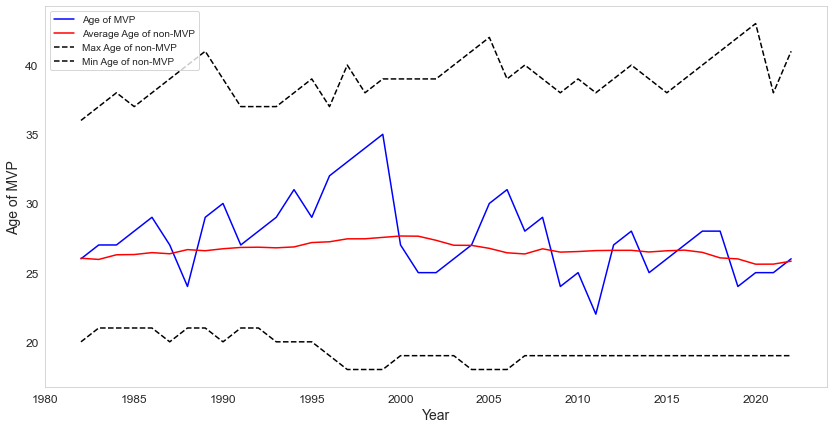

In [22]:
#MVP Age over time
curious_mvp = df[(df.was_mvp_TF == True)]
curious_losers_avg = df[(df.was_mvp_TF == False)].groupby(['season']).mean()
curious_losers_max = df[(df.was_mvp_TF == False)].groupby(['season']).max()
curious_losers_min = df[(df.was_mvp_TF == False)].groupby(['season']).min()

fig, ax = plt.subplots()

ax.plot(curious_mvp.season, curious_mvp.age, 'b', label='Age of MVP')
ax.plot(curious_mvp.season, curious_losers_avg.age, 'r', label='Average Age of non-MVP')
ax.plot(curious_mvp.season, curious_losers_max.age, 'k--', label='Max Age of non-MVP')
ax.plot(curious_mvp.season, curious_losers_min.age, 'k--', label='Min Age of non-MVP')
ax.set_xlabel('Year')
ax.set_ylabel('Age of MVP')
ax.legend(loc='upper left')

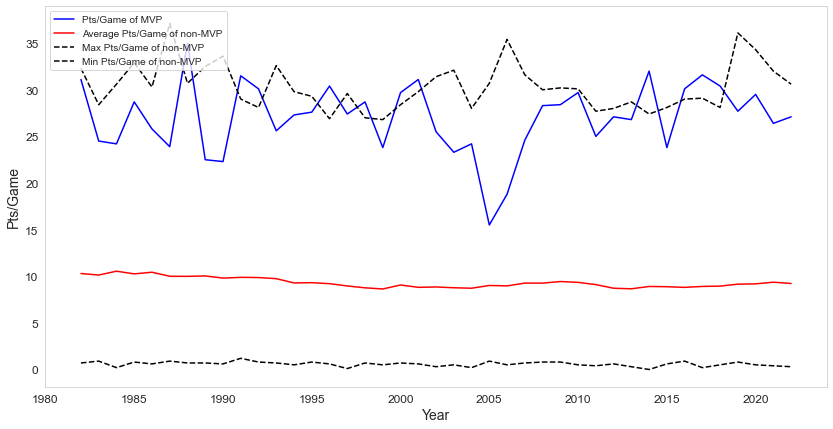

In [23]:
#MVP Pts/Game over time
fig, ax = plt.subplots()

ax.plot(curious_mvp.season, curious_mvp.pts_per_g, 'b', label='Pts/Game of MVP')
ax.plot(curious_mvp.season, curious_losers_avg.pts_per_g, 'r', label='Average Pts/Game of non-MVP')
ax.plot(curious_mvp.season, curious_losers_max.pts_per_g, 'k--', label='Max Pts/Game of non-MVP')
ax.plot(curious_mvp.season, curious_losers_min.pts_per_g, 'k--', label='Min Pts/Game of non-MVP')
ax.set_xlabel('Year')
ax.set_ylabel('Pts/Game')
ax.legend(loc='upper left')

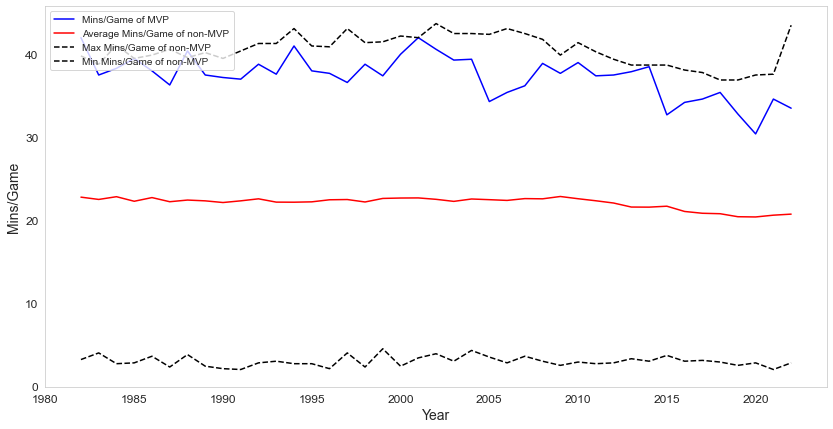

In [24]:
#MVP Mins/Game over time
fig, ax = plt.subplots()

ax.plot(curious_mvp.season, curious_mvp.mp_per_g, 'b', label='Mins/Game of MVP')
ax.plot(curious_mvp.season, curious_losers_avg.mp_per_g, 'r', label='Average Mins/Game of non-MVP')
ax.plot(curious_mvp.season, curious_losers_max.mp_per_g, 'k--', label='Max Mins/Game of non-MVP')
ax.plot(curious_mvp.season, curious_losers_min.mp_per_g, 'k--', label='Min Mins/Game of non-MVP')
ax.set_xlabel('Year')
ax.set_ylabel('Mins/Game')
ax.legend(loc='upper left')

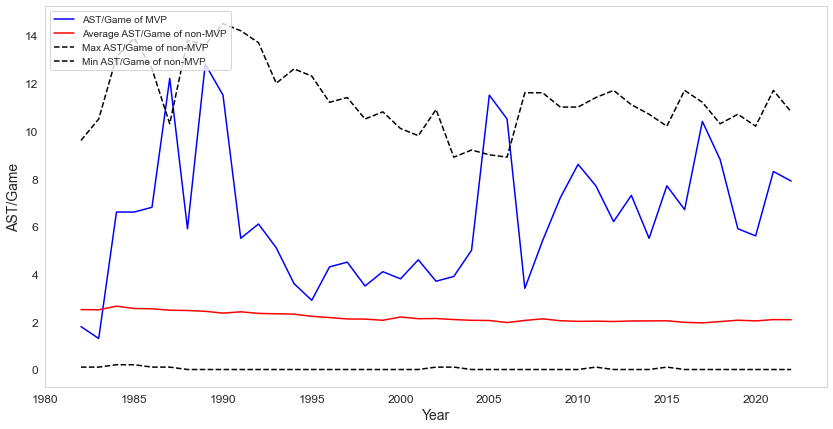

In [25]:
#MVP AST/Game over time
fig, ax = plt.subplots()

ax.plot(curious_mvp.season, curious_mvp.ast_per_g, 'b', label='AST/Game of MVP')
ax.plot(curious_mvp.season, curious_losers_avg.ast_per_g, 'r', label='Average AST/Game of non-MVP')
ax.plot(curious_mvp.season, curious_losers_max.ast_per_g, 'k--', label='Max AST/Game of non-MVP')
ax.plot(curious_mvp.season, curious_losers_min.ast_per_g, 'k--', label='Min AST/Game of non-MVP')
ax.set_xlabel('Year')
ax.set_ylabel('AST/Game')
ax.legend(loc='upper left')

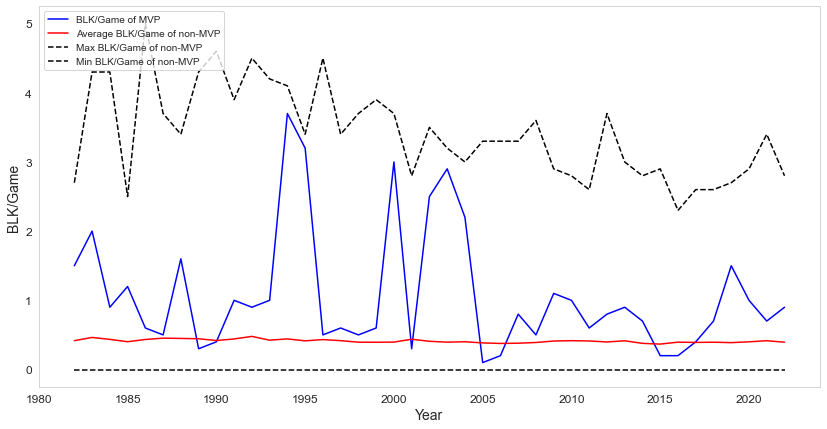

In [26]:
#MVP BLK/Game over time
fig, ax = plt.subplots()

ax.plot(curious_mvp.season, curious_mvp.blk_per_g, 'b', label='BLK/Game of MVP')
ax.plot(curious_mvp.season, curious_losers_avg.blk_per_g, 'r', label='Average BLK/Game of non-MVP')
ax.plot(curious_mvp.season, curious_losers_max.blk_per_g, 'k--', label='Max BLK/Game of non-MVP')
ax.plot(curious_mvp.season, curious_losers_min.blk_per_g, 'k--', label='Min BLK/Game of non-MVP')
ax.set_xlabel('Year')
ax.set_ylabel('BLK/Game')
ax.legend(loc='upper left')

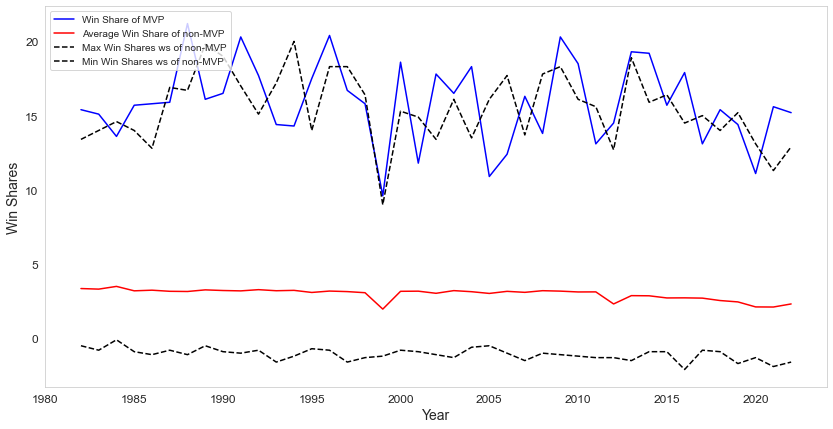

In [27]:
#MVP Win Share over time
fig, ax = plt.subplots()

ax.plot(curious_mvp.season, curious_mvp.ws, 'b', label='Win Share of MVP')
ax.plot(curious_mvp.season, curious_losers_avg.ws, 'r', label='Average Win Share of non-MVP')
ax.plot(curious_mvp.season, curious_losers_max.ws, 'k--', label='Max Win Shares ws of non-MVP')
ax.plot(curious_mvp.season, curious_losers_min.ws, 'k--', label='Min Win Shares ws of non-MVP')
ax.set_xlabel('Year')
ax.set_ylabel('Win Shares')
ax.legend(loc='upper left')

### Feature Engineering & Data Prep for Model Development <a name='feateng'></a>

<AxesSubplot:>

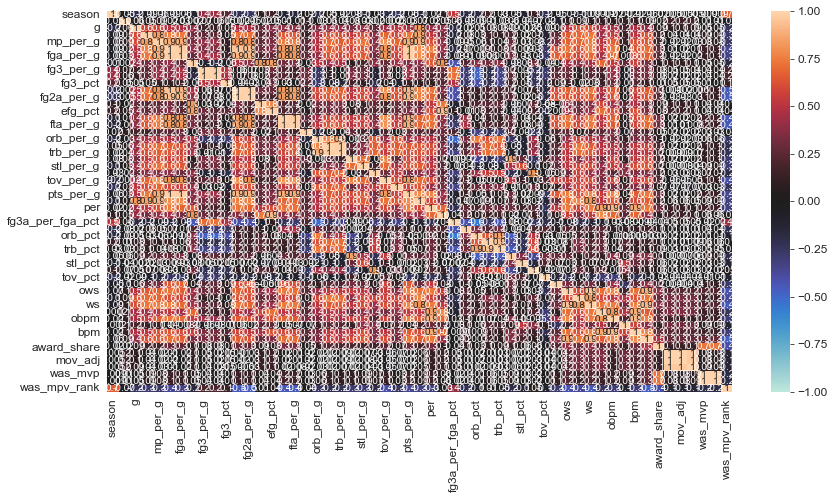

In [28]:
# Pearson Correlation Heat Map
sns.heatmap(df.corr(), annot = True, vmin=-1, vmax=1, center= 0, fmt='.1g')

#### Univariate Feature Analysis <a name='unifeat'></a>

In [29]:
# Since the pearson correlation map is too busy we will use Univariate Feature Analysis to find the top features we should use in our model development

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

X = df.drop(['was_mvp', 'season', 'player','pos','team_id','award_share','was_mvp_TF','was_mpv_rank'], axis = 1) #Predictor/Features
y = df[['was_mvp']] #target column 0/1 format

# Scale the data for Feature Analysis

minmax_scaler = MinMaxScaler()
#std_scaler = StandardScaler()

# Transforming the X data values into 0/1
minmax_scaler.fit(X)
X_transformed = minmax_scaler.transform(X)


# apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X_transformed,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

# concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(20,'Score'))  #print 20 best features
uniqueValues = featureScores.nlargest(20,'Score')['Specs'].unique()
print(uniqueValues) #list features

         Specs      Score
41          ws  58.270972
46        vorp  54.947024
14    ft_per_g  49.496281
15   fta_per_g  43.878705
2           gs  40.009980
39         ows  39.760042
25   pts_per_g  37.232497
10   fg2_per_g  35.197543
4     fg_per_g  34.364742
5    fga_per_g  26.707934
11  fg2a_per_g  26.649831
20   ast_per_g  22.808333
40         dws  22.039614
18   drb_per_g  21.509394
23   tov_per_g  19.305835
26          mp  18.641970
19   trb_per_g  15.822429
3     mp_per_g  11.582732
21   stl_per_g  10.166994
34     ast_pct   9.033241
['ws' 'vorp' 'ft_per_g' 'fta_per_g' 'gs' 'ows' 'pts_per_g' 'fg2_per_g'
 'fg_per_g' 'fga_per_g' 'fg2a_per_g' 'ast_per_g' 'dws' 'drb_per_g'
 'tov_per_g' 'mp' 'trb_per_g' 'mp_per_g' 'stl_per_g' 'ast_pct']


In [30]:
df_features = df[['ws', 'vorp', 'ft_per_g', 'fta_per_g', 'gs' ,'ows', 'pts_per_g', 'fg2_per_g',
 'fg_per_g', 'fga_per_g', 'fg2a_per_g', 'ast_per_g', 'dws', 'drb_per_g',
 'tov_per_g', 'mp', 'trb_per_g', 'mp_per_g', 'stl_per_g' ,'ast_pct']]

<AxesSubplot:>

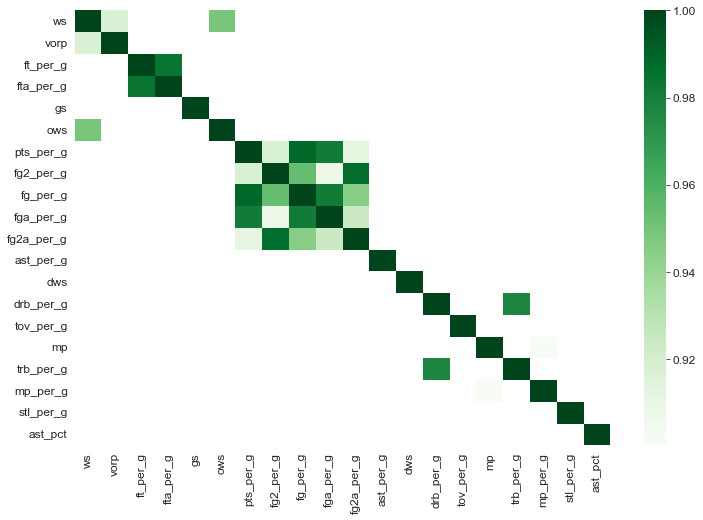

In [31]:
corr = df_features.corr()

kot = corr[abs(corr) >= 0.9]
plt.figure(figsize=(12,8))
sns.heatmap(kot, cmap="Greens")

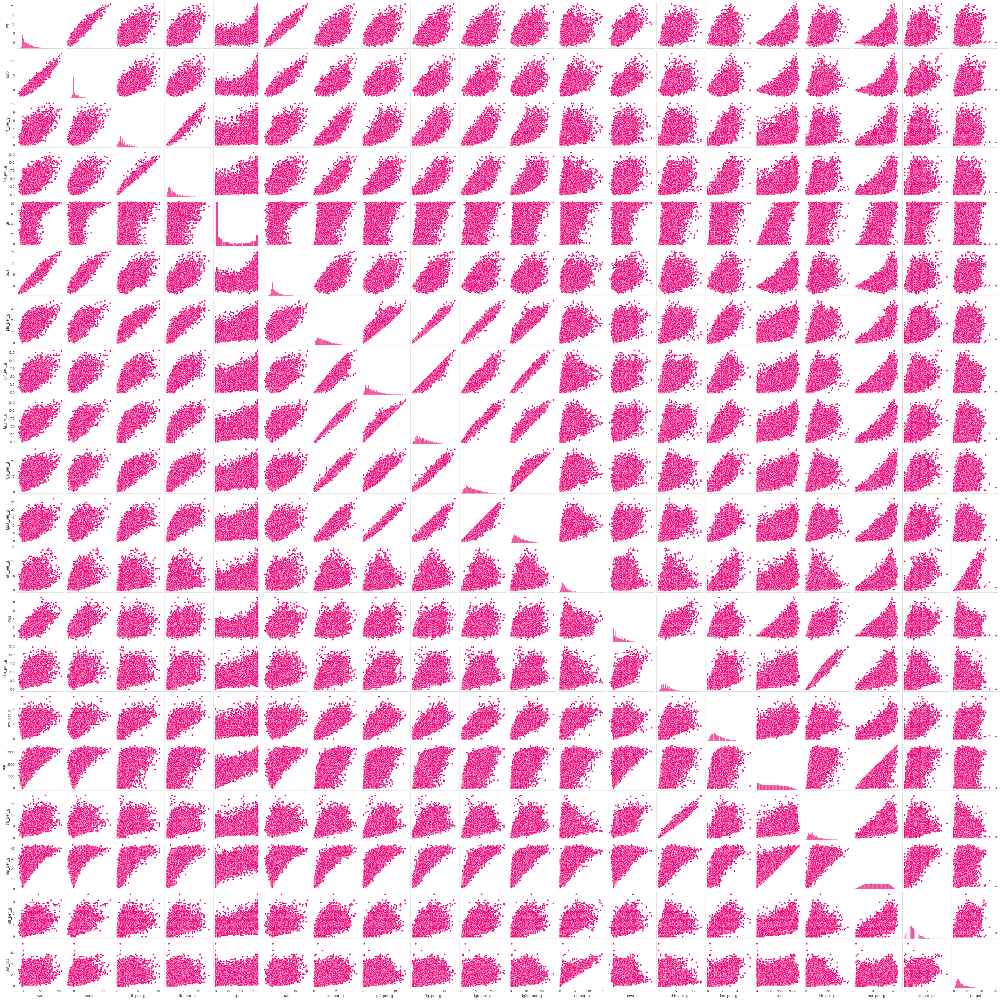

In [32]:
# Pair Plot to determine Colinearaity between important features in order to reduce the feature set further

sns.pairplot(df_features)

In [33]:
dfcorr = df_features.drop(['ows', 'fga_per_g','mp_per_g','fga_per_g','fg2_per_g','trb_per_g'], axis = 1)

<AxesSubplot:>

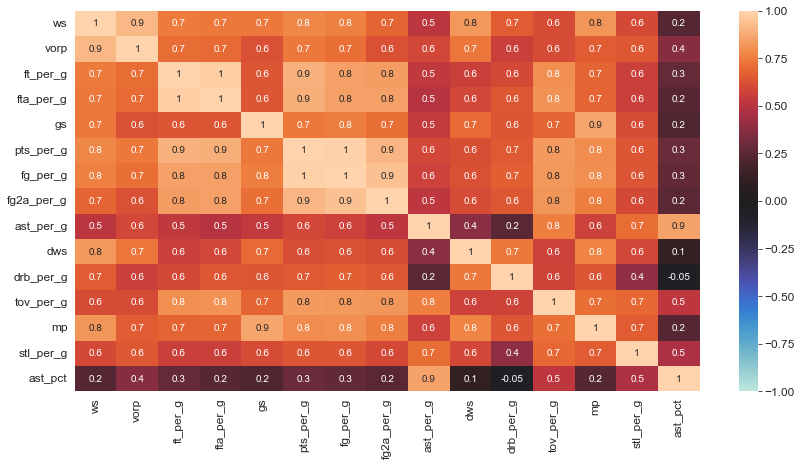

In [34]:
# Pearson Correlation Heat Map
#sns.set(rc={"figure.figsize":(25, 20)})
sns.heatmap(dfcorr.corr(), annot = True, vmin=-1, vmax=1, center= 0, fmt='.1g')

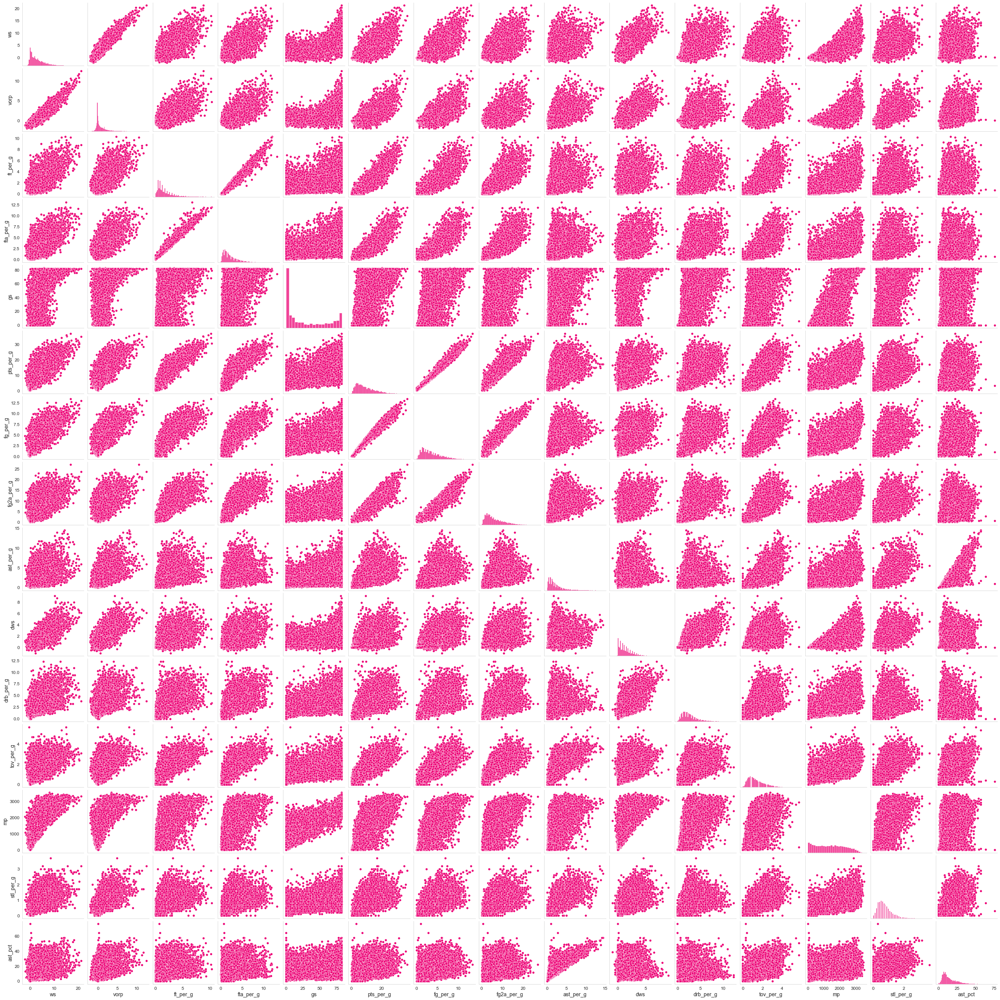

In [35]:
sns.pairplot(dfcorr)

<div class="alert alert-block alert-warning"> WS and OWS as well as FGA_per_G and PTS_per_G are have a linear relationship. There are other co-linear relationships in the selected variables so the following will be removed from the input features: 'ows', 'fga_per_g','mp_per_g','ast_pct','pts_per_g'.

In [36]:
# Final Feature Listing

dfcorr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14783 entries, 0 to 14782
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ws          14783 non-null  float64
 1   vorp        14783 non-null  float64
 2   ft_per_g    14783 non-null  float64
 3   fta_per_g   14783 non-null  float64
 4   gs          14783 non-null  int64  
 5   pts_per_g   14783 non-null  float64
 6   fg_per_g    14783 non-null  float64
 7   fg2a_per_g  14783 non-null  float64
 8   ast_per_g   14783 non-null  float64
 9   dws         14783 non-null  float64
 10  drb_per_g   14783 non-null  float64
 11  tov_per_g   14783 non-null  float64
 12  mp          14783 non-null  int64  
 13  stl_per_g   14783 non-null  float64
 14  ast_pct     14783 non-null  float64
dtypes: float64(13), int64(2)
memory usage: 1.7 MB


In [37]:
list(dfcorr.columns.values)

['ws',
 'vorp',
 'ft_per_g',
 'fta_per_g',
 'gs',
 'pts_per_g',
 'fg_per_g',
 'fg2a_per_g',
 'ast_per_g',
 'dws',
 'drb_per_g',
 'tov_per_g',
 'mp',
 'stl_per_g',
 'ast_pct']

In [38]:
#Use data from season 2012 and beyond to feed into the model.

df = df[df['season'] > 2011] 

#### Final Dataframes for Model Input <a name='dataframes'></a>

In [39]:
# Define Test and Validation Seasons
# Train data set 2012 to 2020 = 80%
# Test data set 2021 = 10%
# prediction season set 2022 = 10%

test_season_1stmodel_selection = 2020
test_season = 2021
validation_season = 2022

In [40]:
# Define Training & Test dataframes

df_train = df[(df.season < test_season)]
df_train_1stmodel_selection = df[(df.season < test_season_1stmodel_selection)]
df_test_1stmodel_selection = df[(df.season >= test_season_1stmodel_selection)]
df_test = df[(df.season == test_season)]
df_val = df[(df.season == validation_season)]

In [41]:
# Split data into Target & Features

# Train data sets
y_train = df_train['award_share']
#X_train = df_train[['ws', 'gs','pts_per_g', 'fga_per_g', 'fg2a_per_g', 'ast_per_g', 'dws','drb_per_g', 'tov_per_g' ,'mp', 'mp_per_g', 'stl_per_g',
# 'ast_pct', 'blk_per_g', 'win_loss_pct', 'usg_pct', 'orb_per_g']]
X_train = df_train[['ws',
 'vorp',
 'ft_per_g',
 'fta_per_g',
 'gs',
 'pts_per_g',
 'fg_per_g',
 'fg2a_per_g',
 'ast_per_g',
 'dws',
 'drb_per_g',
 'tov_per_g',
 'mp',
 'stl_per_g',
 'ast_pct']]

# Test data sets for passing through many models to select top 3 performing models. Season 2017 to 2022 which represents about 20% of the records.
y_train_1stmodel_selection = df_train_1stmodel_selection['award_share']
#X_train_1stmodel_selection = df_train_1stmodel_selection[['ws', 'gs', 'pts_per_g', 'fga_per_g', 'fg2a_per_g', 'ast_per_g', 'dws','drb_per_g', 'tov_per_g' ,'mp', 'mp_per_g', 'stl_per_g',
# 'ast_pct', 'blk_per_g', 'win_loss_pct', 'usg_pct', 'orb_per_g']]
X_train_1stmodel_selection = df_train_1stmodel_selection[['ws',
 'vorp',
 'ft_per_g',
 'fta_per_g',
 'gs',
 'pts_per_g',
 'fg_per_g',
 'fg2a_per_g',
 'ast_per_g',
 'dws',
 'drb_per_g',
 'tov_per_g',
 'mp',
 'stl_per_g',
 'ast_pct']]

y_test_1stmodel_selection = df_test_1stmodel_selection['award_share']
#X_test_1stmodel_selection = df_test_1stmodel_selection[['ws', 'gs', 'pts_per_g', 'fga_per_g', 'fg2a_per_g', 'ast_per_g', 'dws','drb_per_g', 'tov_per_g' ,'mp', 'mp_per_g', 'stl_per_g',
# 'ast_pct', 'blk_per_g', 'win_loss_pct', 'usg_pct', 'orb_per_g']]
X_test_1stmodel_selection = df_test_1stmodel_selection[['ws',
 'vorp',
 'ft_per_g',
 'fta_per_g',
 'gs',
 'pts_per_g',
 'fg_per_g',
 'fg2a_per_g',
 'ast_per_g',
 'dws',
 'drb_per_g',
 'tov_per_g',
 'mp',
 'stl_per_g',
 'ast_pct']]

# Test data sets for top 3 models
y_test = df_test['award_share']
#X_test = df_test[['ws', 'gs', 'pts_per_g', 'fga_per_g', 'fg2a_per_g', 'ast_per_g', 'dws','drb_per_g', 'tov_per_g' ,'mp', 'mp_per_g', 'stl_per_g',
# 'ast_pct', 'blk_per_g', 'win_loss_pct', 'usg_pct', 'orb_per_g']]
X_test = df_test[['ws',
 'vorp',
 'ft_per_g',
 'fta_per_g',
 'gs',
 'pts_per_g',
 'fg_per_g',
 'fg2a_per_g',
 'ast_per_g',
 'dws',
 'drb_per_g',
 'tov_per_g',
 'mp',
 'stl_per_g',
 'ast_pct']]

# Validation data set
y_val = df_val['award_share']
#X_val = df_val[['ws', 'gs', 'pts_per_g', 'fga_per_g', 'fg2a_per_g', 'ast_per_g', 'dws','drb_per_g', 'tov_per_g' ,'mp', 'mp_per_g', 'stl_per_g',
# 'ast_pct', 'blk_per_g', 'win_loss_pct', 'usg_pct', 'orb_per_g']]
X_val = df_val[['ws',
 'vorp',
 'ft_per_g',
 'fta_per_g',
 'gs',
 'pts_per_g',
 'fg_per_g',
 'fg2a_per_g',
 'ast_per_g',
 'dws',
 'drb_per_g',
 'tov_per_g',
 'mp',
 'stl_per_g',
 'ast_pct']]   

In [42]:
# Scale the data for Model Development

std_scaler = StandardScaler()

# Transforming the X data values
std_scaler.fit(X_train)
X_train = std_scaler.transform(X_train)
X_train_1stmodel_selection = std_scaler.transform(X_train_1stmodel_selection)
X_test_1stmodel_selection = std_scaler.transform(X_test_1stmodel_selection)
X_test = std_scaler.transform(X_test)
X_val = std_scaler.transform(X_val)

### Model Development on Training Data & Predict on Test Data <a name='modelpredict'></a>

In [43]:
# Generate Regressor models on many models to select the best few to proceed into the Prediction on the Test data with HyperParameter model tuning

regressors = [
    KNeighborsRegressor(),
    GradientBoostingRegressor(random_state=42),
    ExtraTreesRegressor(random_state=42),
    RandomForestRegressor(random_state=42),
    DecisionTreeRegressor(random_state=42),
    LinearRegression(),
    Lasso(random_state=42),
    Ridge(random_state=42),
    AdaBoostRegressor(random_state=42),
    ElasticNet(random_state=42),
    SVR(C=25),
    LGBMRegressor(random_state=42),
    xgb.XGBRegressor(random_state=42),
    #CatBoostRegressor(learning_rate=1, depth=6, loss_function='RMSE',verbose=False)
    CatBoostRegressor(verbose=False)
]

In [44]:
# Loop through all the models and scoring

#data_results = pd.DataFrame()
from time import time

head = 15
for model in regressors[:head]:
    start = time()
    model.fit(X_train_1stmodel_selection, y_train_1stmodel_selection)
    train_time = time() - start
    start = time()
    y_pred = model.predict(X_test_1stmodel_selection)
    predict_time = time()-start
    evs = (explained_variance_score(y_test_1stmodel_selection, y_pred))
    mae = (mean_absolute_error(y_test_1stmodel_selection, y_pred))
    rmse = (mean_squared_error(y_test_1stmodel_selection, y_pred))
    r2 = (r2_score(y_test_1stmodel_selection, y_pred))
    
    #dict_met = {'Model': [model], 'RMSE': [rmse], 'R²': [r2]}
    #data_results = pd.DataFrame(data=dict_met)
    
    print(model)
    print("\tTraining time: %0.3fs" % train_time)
    print("---TEST DATA RESULTS---")
    print("\tPrediction time: %0.3fs" % predict_time)
    print("\tExplained variance: %0.4f" % explained_variance_score(y_test_1stmodel_selection, y_pred))
    print("\tMean absolute error: %0.4f"% mean_absolute_error(y_test_1stmodel_selection, y_pred))
    print("\tMean root squared error: %0.4f"% mean_squared_error(y_test_1stmodel_selection, y_pred)**0.5)
    print("\tR2 score: %0.4f"% r2_score(y_test_1stmodel_selection, y_pred))
    
    # Find Accuracy of predicting the 1st place MVP Player in the Test data
    df_test_1stmodel_selection['mvp_award_share_PRED'] = y_pred
    df_test_1stmodel_selection['was_mpv_rank_PRED'] = df_test_1stmodel_selection.groupby('season')['mvp_award_share_PRED'].rank(method='max',ascending=False)
    df_test_1stmodel_selection['was_mpv_rank_PRED'] = df_test_1stmodel_selection['was_mpv_rank_PRED'].astype(int)
    pred_output = df_test_1stmodel_selection[['season','player','was_mvp_TF','was_mpv_rank','was_mpv_rank_PRED']]
    pred_output['was_mpv_rank'] = pred_output['was_mpv_rank'].astype(int)
    mvp_pred_per = pred_output[(pred_output.was_mvp_TF == True) & (pred_output.was_mpv_rank == 1)]
    mvp_pred_per['per_mvp_pred'] = mvp_pred_per['was_mpv_rank'] == mvp_pred_per['was_mpv_rank_PRED']
    mvp_pred_per['per_mvp_pred'].astype(int)
    per = (mvp_pred_per['per_mvp_pred'].mean())*100
    print("\tMVP 1st Place Prediction Accuracy: %0.2f%%"% per)
    
    # Acurracy of Predicting the top 3 MVP Finalists
    mvp_pred_per_top3 = pred_output[(pred_output.was_mpv_rank <= 3)]
    mvp_pred_per_top3['per_mvp_pred'] = mvp_pred_per_top3['was_mpv_rank'] == mvp_pred_per_top3['was_mpv_rank_PRED']
    mvp_pred_per_top3['per_mvp_pred'].astype(int)
    per_top3 = (mvp_pred_per_top3['per_mvp_pred'].mean())*100
    print("\tMVP Top 3 Finalist Prediction Accuracy: %0.2f%%"% per_top3)
    print()

KNeighborsRegressor()
	Training time: 0.009s
---TEST DATA RESULTS---
	Prediction time: 0.046s
	Explained variance: 0.6028
	Mean absolute error: 0.0039
	Mean root squared error: 0.0361
	R2 score: 0.6020
	MVP 1st Place Prediction Accuracy: 66.67%
	MVP Top 3 Finalist Prediction Accuracy: 33.33%

GradientBoostingRegressor(random_state=42)
	Training time: 0.481s
---TEST DATA RESULTS---
	Prediction time: 0.001s
	Explained variance: 0.5982
	Mean absolute error: 0.0049
	Mean root squared error: 0.0362
	R2 score: 0.5981
	MVP 1st Place Prediction Accuracy: 66.67%
	MVP Top 3 Finalist Prediction Accuracy: 55.56%

ExtraTreesRegressor(random_state=42)
	Training time: 0.205s
---TEST DATA RESULTS---
	Prediction time: 0.009s
	Explained variance: 0.6622
	Mean absolute error: 0.0045
	Mean root squared error: 0.0332
	R2 score: 0.6621
	MVP 1st Place Prediction Accuracy: 66.67%
	MVP Top 3 Finalist Prediction Accuracy: 33.33%

RandomForestRegressor(random_state=42)
	Training time: 1.298s
---TEST DATA RESULTS

<div class="alert alert-block alert-warning">From the above results of many regressor models the following we will select 4 top performing models to move forward with. We consider the following performance measure to select the top models, MVP 1st Place Prediction Accuaracy, Top 3 Finalist Prediction Accuracy, R2 and RMSE. The top 4 performing models where: Random Forest, Extra Trees Regressor, XGBoost Regressor and CatBoost Regressor.

#### Randon Forest <a name='rfr_traintest'></a>

In [45]:
# Random Forest Regressor

param_grid = {'n_estimators': [15,25,50,64,100,150,200], 'max_features': [2,3,4,5,'sqrt'], 'bootstrap': [True,False], 'oob_score': [True], 'min_samples_split': [2, 5, 10],'max_depth': [5, 10, 15, 20]}

import time
time_start_rfc = time.time()

rfc = RandomForestRegressor()
#grid = GridSearchCV(rfc, param_grid, scoring = 'neg_root_mean_squared_error', n_jobs=-1)
grid_rf = RandomizedSearchCV(rfc, param_grid, n_iter=60, scoring = 'neg_root_mean_squared_error', n_jobs=-1, random_state=42)

grid_rf.fit(X_train, y_train)

rfc_model = RandomForestRegressor(**grid_rf.best_params_)

print(grid_rf.best_params_)

print('Random Forest Regressor done on Training Data Set! Time elapsed: {} seconds'.format(time.time() - time_start_rfc))

{'oob_score': True, 'n_estimators': 200, 'min_samples_split': 5, 'max_features': 5, 'max_depth': 15, 'bootstrap': True}
Random Forest Regressor done on Training Data Set! Time elapsed: 17.2194721698761 seconds


In [46]:
# Fit the Optimized Model with training data
rfc_model.fit(X_train, y_train)

# Predict the model on the test data
pred_rfc = rfc_model.predict(X_test).round(3)
 
# R2, MSE, RMSE scoring
mse = mean_squared_error(y_test, pred_rfc)
rmse = mean_squared_error(y_test, pred_rfc)**0.5
r2 = round(r2_score(y_test, pred_rfc),3)

print("Test Data Regression Model Performance Results: Random Forest")
print("R2: %.4f" %r2)
print("MSE: %.4f" % mse)
print("RMSE: %.4f" % rmse)

Test Data Regression Model Performance Results: Random Forest
R2: 0.7340
MSE: 0.0008
RMSE: 0.0290


In [47]:
df_test['mvp_award_share_PRED'] = pred_rfc
df_test['was_mpv_rank_PRED'] = df_test.groupby('season')['mvp_award_share_PRED'].rank(method='max',ascending=False)
df_test['was_mpv_rank_PRED'] = df_test['was_mpv_rank_PRED'].astype(int)
pred_output = df_test[['season','player','pos','team_id','was_mvp_TF','award_share','was_mpv_rank','mvp_award_share_PRED','was_mpv_rank_PRED']]
pred_output['was_mpv_rank'] = pred_output['was_mpv_rank'].astype(int)
pred_output.sort_values(by=['mvp_award_share_PRED'], ascending=False).head(10)

,season,player,pos,team_id,was_mvp_TF,award_share,was_mpv_rank,mvp_award_share_PRED,was_mpv_rank_PRED
13760,2021,Nikola Jokić,C,DEN,True,0.961,1,0.645,1
13762,2021,Stephen Curry,PG,GSW,False,0.449,3,0.304,2
13808,2021,Bradley Beal,SG,WAS,False,0.000,503,0.200,3
13763,2021,Giannis Antetokounmpo,PF,MIL,False,0.345,4,0.175,4
13761,2021,Joel Embiid,C,PHI,False,0.580,2,0.168,5
13765,2021,Luka Dončić,PG,DAL,False,0.042,6,0.155,6
13766,2021,Damian Lillard,PG,POR,False,0.038,7,0.103,7
14250,2021,Zion Williamson,PF,NOP,False,0.000,503,0.101,8
13990,2021,Kyrie Irving,PG,BRK,False,0.000,503,0.079,9
14030,2021,Zach LaVine,SG,CHI,False,0.000,503,0.076,10


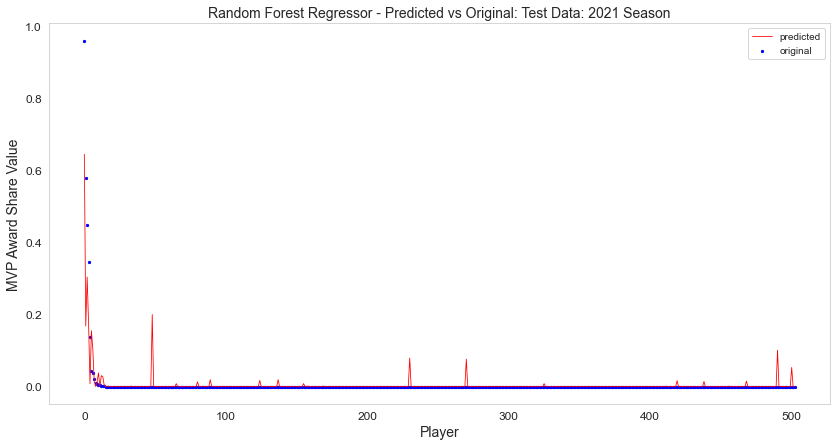

In [48]:
x_ax = range(len(y_test))
plt.scatter(x_ax, y_test, s=5, color="blue", label="original")
plt.plot(x_ax, pred_rfc, lw=0.8, color="red", label="predicted")
plt.legend()
plt.title("Random Forest Regressor - Predicted vs Original: Test Data: 2021 Season")
plt.xlabel("Player")
plt.ylabel("MVP Award Share Value")
plt.show()

#### Extra Trees Regressor<a name='etr_traintest'></a>

In [49]:
# Extra Trees Regressor

param_grid = {'n_estimators': [int(x) for x in np.arange(start = 100, stop = 2100, step = 100)],
    'criterion': ['mse'],
    'max_depth': [2,8,16,32,50],
    'min_samples_split': [2,4,6],
    'min_samples_leaf': [1,2],
    'oob_score': [True, False],
    'max_features': ['auto','sqrt'],    
    'bootstrap': [True, False],
    'warm_start': [True, False]}

time_start_etr = time.time()

etr = ExtraTreesRegressor()
#grid = GridSearchCV(etr, param_grid = param_grid, scoring = 'neg_root_mean_squared_error', n_jobs=-1)
grid_et = RandomizedSearchCV(etr, param_grid, n_iter=60, scoring = 'neg_root_mean_squared_error', n_jobs=-1)

grid_et.fit(X_train, y_train)

etr_model = ExtraTreesRegressor(**grid_et.best_params_)

print(grid_et.best_params_)

print('Extra Trees Regressor done on Training Data Set! Time elapsed: {} seconds'.format(time.time() - time_start_etr))

{'warm_start': True, 'oob_score': False, 'n_estimators': 1300, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 32, 'criterion': 'mse', 'bootstrap': False}
Extra Trees Regressor done on Training Data Set! Time elapsed: 138.43864464759827 seconds


In [50]:
# Fit the Optimized Model with training data
etr_model.fit(X_train, y_train)

# Predict the model on the test data
pred_etr = etr_model.predict(X_test).round(3)
 
# R2, MSE, RMSE scoring
mse = mean_squared_error(y_test, pred_etr)
r2 = round(r2_score(y_test, pred_etr),3)

print("Test Data Regression Model Performance Results: Extra Trees Regressor")
print("Test data set R2: %.4f" %r2)
print("Test data set MSE: %.4f" % mse)
print("Test data set RMSE: %.4f" % (mse**(1/2.0)))

Test Data Regression Model Performance Results: Extra Trees Regressor
Test data set R2: 0.7490
Test data set MSE: 0.0008
Test data set RMSE: 0.0282


In [51]:
df_test['mvp_award_share_PRED'] = pred_etr
df_test['was_mpv_rank_PRED'] = df_test.groupby('season')['mvp_award_share_PRED'].rank(method='max',ascending=False)
df_test['was_mpv_rank_PRED'] = df_test['was_mpv_rank_PRED'].astype(int)
pred_output = df_test[['season','player','pos','team_id','was_mvp_TF','award_share','was_mpv_rank','mvp_award_share_PRED','was_mpv_rank_PRED']]
pred_output['was_mpv_rank'] = pred_output['was_mpv_rank'].astype(int)
pred_output.sort_values(by=['mvp_award_share_PRED'], ascending=False).head(10)

,season,player,pos,team_id,was_mvp_TF,award_share,was_mpv_rank,mvp_award_share_PRED,was_mpv_rank_PRED
13760,2021,Nikola Jokić,C,DEN,True,0.961,1,0.725,1
13763,2021,Giannis Antetokounmpo,PF,MIL,False,0.345,4,0.277,2
13762,2021,Stephen Curry,PG,GSW,False,0.449,3,0.265,3
13808,2021,Bradley Beal,SG,WAS,False,0.000,503,0.152,4
13765,2021,Luka Dončić,PG,DAL,False,0.042,6,0.150,5
14250,2021,Zion Williamson,PF,NOP,False,0.000,503,0.121,6
13761,2021,Joel Embiid,C,PHI,False,0.580,2,0.104,7
13766,2021,Damian Lillard,PG,POR,False,0.038,7,0.088,8
14030,2021,Zach LaVine,SG,CHI,False,0.000,503,0.054,9
13990,2021,Kyrie Irving,PG,BRK,False,0.000,503,0.033,10


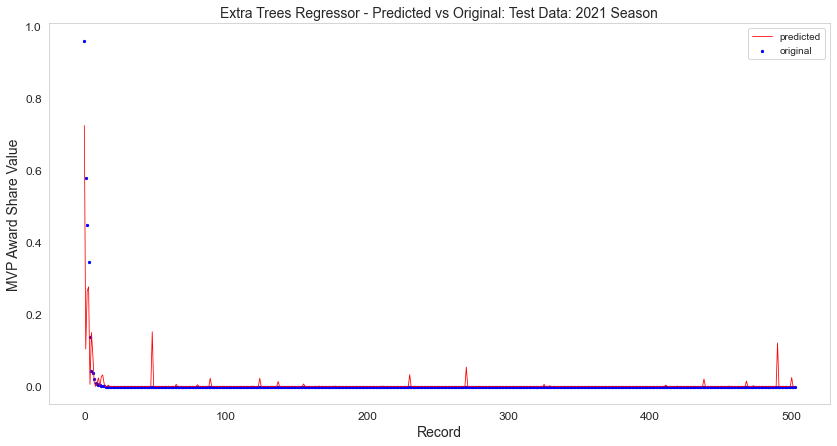

In [52]:
x_ax = range(len(y_test))
plt.scatter(x_ax, y_test, s=5, color="blue", label="original")
plt.plot(x_ax, pred_etr, lw=0.8, color="red", label="predicted")
plt.legend()
plt.title("Extra Trees Regressor - Predicted vs Original: Test Data: 2021 Season")
plt.xlabel("Record")
plt.ylabel("MVP Award Share Value")
plt.show()

#### XGBoost Regressor <a name='lgbm_traintest'></a>

In [53]:
# XGBoost Regressor

param_grid = {'learning_rate': [0.01, 0.1],
        'max_depth': [3, 5, 6, 7, 10],
        'min_child_weight': [1, 3, 5],
        'subsample': [0.5, 0.7, 1],
        'colsample_bytree': [0.5, 0.7],
        'n_estimators' : [10 , 20, 30, 40, 50, 100],
        'objective': ['reg:squarederror']}

time_start_etr = time.time()

xgbr = xgb.XGBRegressor()
#grid = GridSearchCV(lgmr, param_grid = param_grid, scoring = 'neg_root_mean_squared_error', n_jobs=-1)
grid_xgb = RandomizedSearchCV(xgbr, param_grid, n_iter=60, scoring = 'neg_root_mean_squared_error', n_jobs=-1)

grid_xgb.fit(X_train, y_train)

xgb_model = xgb.XGBRegressor(**grid_xgb.best_params_)

print(grid_xgb.best_params_)

print('XGBoost Regressor done on Training Data Set! Time elapsed: {} seconds'.format(time.time() - time_start_etr))

{'subsample': 1, 'objective': 'reg:squarederror', 'n_estimators': 50, 'min_child_weight': 1, 'max_depth': 3, 'learning_rate': 0.1, 'colsample_bytree': 0.7}
XGBoost Regressor done on Training Data Set! Time elapsed: 9.026738166809082 seconds


In [54]:
# Fit the Optimized Model with training data
xgb_model.fit(X_train, y_train)

# Predict the model on the test data
pred_xgb = xgb_model.predict(X_test).round(3)
 
# R2, MSE, RMSE scoring
mse = mean_squared_error(y_test, pred_xgb)
r2 = round(r2_score(y_test, pred_xgb),3)

print("Test Data Regression Model Performance Results: XGBoost Regressor")
print("Test data set R2: %.4f" %r2)
print("Test data set MSE: %.4f" % mse)
print("Test data set RMSE: %.4f" % (mse**(1/2.0)))

Test Data Regression Model Performance Results: XGBoost Regressor
Test data set R2: 0.6650
Test data set MSE: 0.0011
Test data set RMSE: 0.0326


In [55]:
df_test['mvp_award_share_PRED'] = pred_xgb
df_test['was_mpv_rank_PRED'] = df_test.groupby('season')['mvp_award_share_PRED'].rank(method='max',ascending=False)
df_test['was_mpv_rank_PRED'] = df_test['was_mpv_rank_PRED'].astype(int)
pred_output = df_test[['season','player','pos','team_id','was_mvp_TF','award_share','was_mpv_rank','mvp_award_share_PRED','was_mpv_rank_PRED']]
pred_output['was_mpv_rank'] = pred_output['was_mpv_rank'].astype(int)
pred_output.sort_values(by=['mvp_award_share_PRED'], ascending=False).head(10)

,season,player,pos,team_id,was_mvp_TF,award_share,was_mpv_rank,mvp_award_share_PRED,was_mpv_rank_PRED
13760,2021,Nikola Jokić,C,DEN,True,0.961,1,0.604,1
13762,2021,Stephen Curry,PG,GSW,False,0.449,3,0.322,2
13765,2021,Luka Dončić,PG,DAL,False,0.042,6,0.305,3
13763,2021,Giannis Antetokounmpo,PF,MIL,False,0.345,4,0.267,4
13808,2021,Bradley Beal,SG,WAS,False,0.000,503,0.236,5
13766,2021,Damian Lillard,PG,POR,False,0.038,7,0.182,6
13761,2021,Joel Embiid,C,PHI,False,0.580,2,0.130,7
14030,2021,Zach LaVine,SG,CHI,False,0.000,503,0.060,8
14250,2021,Zion Williamson,PF,NOP,False,0.000,503,0.046,9
14260,2021,Trae Young,PG,ATL,False,0.000,503,0.037,10


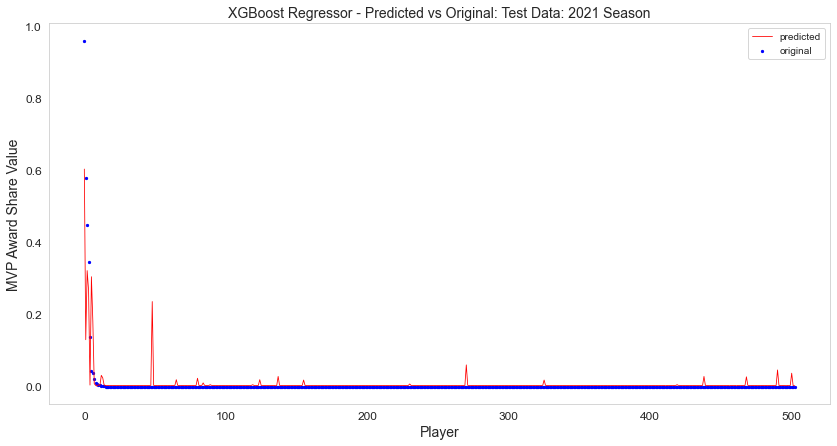

In [56]:
x_ax = range(len(y_test))
plt.scatter(x_ax, y_test, s=5, color="blue", label="original")
plt.plot(x_ax, pred_xgb, lw=0.8, color="red", label="predicted")
plt.legend()
plt.title("XGBoost Regressor - Predicted vs Original: Test Data: 2021 Season")
plt.xlabel("Player")
plt.ylabel("MVP Award Share Value")
plt.show()

#### CatBoost Regressor <a name='cat_traintest'></a>

In [57]:
# CatBoost Regressor

param_grid = {'depth' : [6,8,10],
              'learning_rate' : [0.01, 0.05, 0.1],
              'iterations'    : [30, 50, 100]}

time_start_etr = time.time()

cat = CatBoostRegressor(verbose=False)
#grid = GridSearchCV(lgmr, param_grid = param_grid, scoring = 'neg_root_mean_squared_error', n_jobs=-1)
grid_cat = RandomizedSearchCV(cat, param_grid, n_iter=60, scoring = 'neg_root_mean_squared_error', n_jobs=-1)

grid_cat.fit(X_train, y_train)

cat_model = CatBoostRegressor(**grid_cat.best_params_)

print(grid_cat.best_params_)

print('CatBoost Regressor done on Training Data Set! Time elapsed: {} seconds'.format(time.time() - time_start_etr))

{'learning_rate': 0.1, 'iterations': 100, 'depth': 6}
CatBoost Regressor done on Training Data Set! Time elapsed: 45.67440676689148 seconds


In [58]:
# Fit the Optimized Model with training data
cat_model.fit(X_train, y_train, verbose=False)

# Predict the model on the test data
pred_cat = cat_model.predict(X_test).round(3)
 
# R2, MSE, RMSE scoring
mse = mean_squared_error(y_test, pred_cat)
r2 = round(r2_score(y_test, pred_cat),3)

print("Test Data Regression Model Performance Results: CatBoost Regressor Model")
print("Test data set R2: %.4f" %r2)
print("Test data set MSE: %.4f" % mse)
print("Test data set RMSE: %.4f" % (mse**(1/2.0)))

Test Data Regression Model Performance Results: CatBoost Regressor Model
Test data set R2: 0.6580
Test data set MSE: 0.0011
Test data set RMSE: 0.0329


In [59]:
df_test['mvp_award_share_PRED'] = pred_cat
df_test['was_mpv_rank_PRED'] = df_test.groupby('season')['mvp_award_share_PRED'].rank(method='max',ascending=False)
df_test['was_mpv_rank_PRED'] = df_test['was_mpv_rank_PRED'].astype(int)
pred_output = df_test[['season','player','pos','team_id','was_mvp_TF','award_share','was_mpv_rank','mvp_award_share_PRED','was_mpv_rank_PRED']]
pred_output['was_mpv_rank'] = pred_output['was_mpv_rank'].astype(int)
pred_output.sort_values(by=['mvp_award_share_PRED'], ascending=False).head(10)

,season,player,pos,team_id,was_mvp_TF,award_share,was_mpv_rank,mvp_award_share_PRED,was_mpv_rank_PRED
13760,2021,Nikola Jokić,C,DEN,True,0.961,1,0.541,1
13763,2021,Giannis Antetokounmpo,PF,MIL,False,0.345,4,0.298,2
13762,2021,Stephen Curry,PG,GSW,False,0.449,3,0.214,3
13808,2021,Bradley Beal,SG,WAS,False,0.000,503,0.141,4
13765,2021,Luka Dončić,PG,DAL,False,0.042,6,0.125,5
14030,2021,Zach LaVine,SG,CHI,False,0.000,503,0.109,6
13761,2021,Joel Embiid,C,PHI,False,0.580,2,0.096,7
14250,2021,Zion Williamson,PF,NOP,False,0.000,503,0.087,8
13766,2021,Damian Lillard,PG,POR,False,0.038,7,0.076,9
13767,2021,Julius Randle,PF,NYK,False,0.020,8,0.039,10


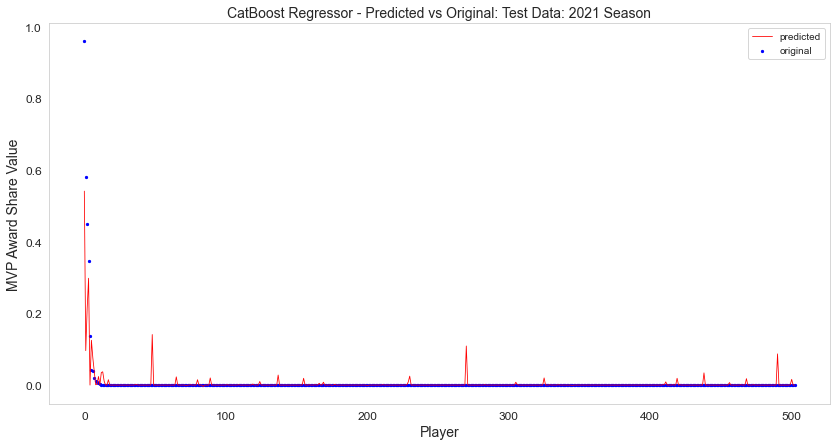

In [60]:
x_ax = range(len(y_test))
plt.scatter(x_ax, y_test, s=5, color="blue", label="original")
plt.plot(x_ax, pred_cat, lw=0.8, color="red", label="predicted")
plt.legend()
plt.title("CatBoost Regressor - Predicted vs Original: Test Data: 2021 Season")
plt.xlabel("Player")
plt.ylabel("MVP Award Share Value")
plt.show()

### Validate ML Model on Validation Data <a name='val'></a>

#### Random Forest <a name='rfc_val'></a>

In [61]:
# Random Forest Regressor Predict the model on Validation Data
pred_rfc = rfc_model.predict(X_val).round(3)
 
# R2, MSE, RMSE scoring
mse = mean_squared_error(y_val, pred_rfc)
r2 = round(r2_score(y_val, pred_rfc),3)

print("Validation prediction R2: %.4f" %r2)
print("Validation prediction MSE: %.4f" % mse)
print("Validation prediction RMSE: %.4f" % (mse**(1/2.0)))

Validation prediction R2: 0.8320
Validation prediction MSE: 0.0005
Validation prediction RMSE: 0.0233


In [62]:
df_val['mvp_award_share_PRED'] = pred_rfc
df_val['was_mpv_rank_PRED'] = df_val.groupby('season')['mvp_award_share_PRED'].rank(method='max',ascending=False)
df_val['was_mpv_rank_PRED'] = df_val['was_mpv_rank_PRED'].astype(int)
pred_output = df_val[['season','player','pos','team_id','was_mvp_TF','award_share','was_mpv_rank','mvp_award_share_PRED','was_mpv_rank_PRED']]
pred_output['was_mpv_rank'] = pred_output['was_mpv_rank'].astype(int)
pred_output.sort_values(by=['mvp_award_share_PRED'], ascending=False).head(10)

,season,player,pos,team_id,was_mvp_TF,award_share,was_mpv_rank,mvp_award_share_PRED,was_mpv_rank_PRED
14263,2022,Nikola Jokić,C,DEN,True,0.875,1,0.809,1
14265,2022,Giannis Antetokounmpo,PF,MIL,False,0.595,3,0.593,2
14264,2022,Joel Embiid,C,PHI,False,0.706,2,0.421,3
14267,2022,Luka Dončić,PG,DAL,False,0.146,5,0.399,4
14274,2022,LeBron James,PF,LAL,False,0.001,12,0.167,5
14273,2022,Kevin Durant,PF,BRK,False,0.001,12,0.162,6
14272,2022,DeMar DeRozan,PF,CHI,False,0.001,12,0.155,7
14780,2022,Trae Young,PG,ATL,False,0.000,520,0.126,8
14269,2022,Ja Morant,PG,MEM,False,0.010,7,0.076,9
14492,2022,Kyrie Irving,PG,BRK,False,0.000,520,0.063,10


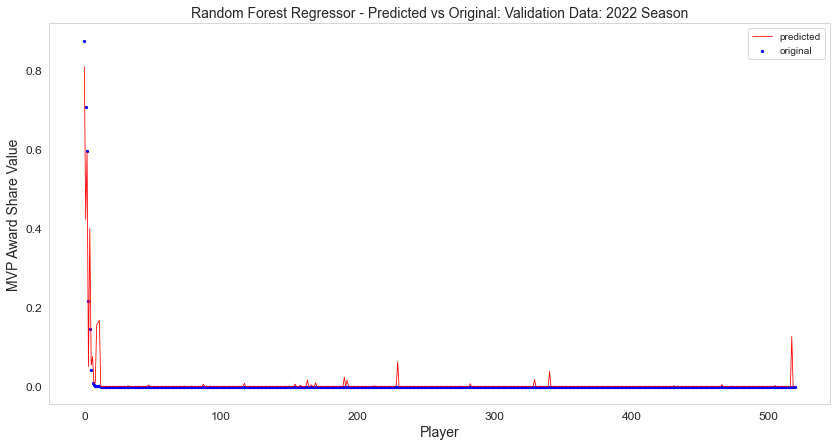

In [63]:
x_ax = range(len(y_val))
plt.scatter(x_ax, y_val, s=5, color="blue", label="original")
plt.plot(x_ax, pred_rfc, lw=0.8, color="red", label="predicted")
plt.legend()
plt.title("Random Forest Regressor - Predicted vs Original: Validation Data: 2022 Season")
plt.xlabel("Player")
plt.ylabel("MVP Award Share Value")
plt.show()

#### Extra Trees Regressor <a name='et_val'></a>

In [64]:
# Extra Trees Regressor Predict the model on Validation Data
pred_etr = etr_model.predict(X_val).round(3)
 
# R2, MSE, RMSE scoring
mse = mean_squared_error(y_val, pred_etr)
r2 = round(r2_score(y_val, pred_etr),3)

print("Validation prediction R2: %.4f" %r2)
print("Validation prediction MSE: %.4f" % mse)
print("Validation prediction RMSE: %.4f" % (mse**(1/2.0)))

Validation prediction R2: 0.8520
Validation prediction MSE: 0.0005
Validation prediction RMSE: 0.0218


In [65]:
df_val['mvp_award_share_PRED'] = pred_etr
df_val['was_mpv_rank_PRED'] = df_val.groupby('season')['mvp_award_share_PRED'].rank(method='max',ascending=False)
df_val['was_mpv_rank_PRED'] = df_val['was_mpv_rank_PRED'].astype(int)
pred_output = df_val[['season','player','pos','team_id','was_mvp_TF','award_share','was_mpv_rank','mvp_award_share_PRED','was_mpv_rank_PRED']]
pred_output['was_mpv_rank'] = pred_output['was_mpv_rank'].astype(int)
pred_output.sort_values(by=['mvp_award_share_PRED'], ascending=False).head(10)

,season,player,pos,team_id,was_mvp_TF,award_share,was_mpv_rank,mvp_award_share_PRED,was_mpv_rank_PRED
14263,2022,Nikola Jokić,C,DEN,True,0.875,1,0.873,1
14265,2022,Giannis Antetokounmpo,PF,MIL,False,0.595,3,0.635,2
14264,2022,Joel Embiid,C,PHI,False,0.706,2,0.442,3
14267,2022,Luka Dončić,PG,DAL,False,0.146,5,0.378,4
14272,2022,DeMar DeRozan,PF,CHI,False,0.001,12,0.158,5
14273,2022,Kevin Durant,PF,BRK,False,0.001,12,0.153,6
14780,2022,Trae Young,PG,ATL,False,0.000,520,0.144,7
14274,2022,LeBron James,PF,LAL,False,0.001,12,0.133,8
14269,2022,Ja Morant,PG,MEM,False,0.010,7,0.076,9
14268,2022,Jayson Tatum,SF,BOS,False,0.043,6,0.058,10


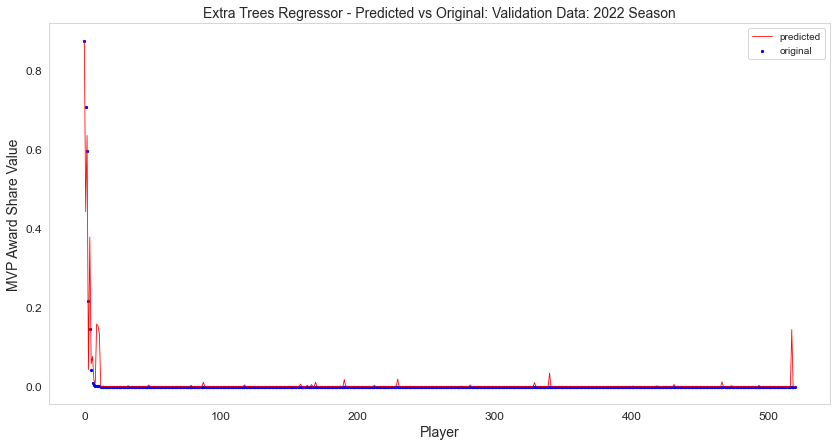

In [66]:
x_ax = range(len(y_val))
plt.scatter(x_ax, y_val, s=5, color="blue", label="original")
plt.plot(x_ax, pred_etr, lw=0.8, color="red", label="predicted")
plt.legend()
plt.title("Extra Trees Regressor - Predicted vs Original: Validation Data: 2022 Season")
plt.xlabel("Player")
plt.ylabel("MVP Award Share Value")
plt.show()

#### XGBoost Regressor <a name='lgbm_val'></a>

In [67]:
# XGBoost Regressor Predict the model on Validation Data
pred_xgb = xgb_model.predict(X_val).round(3)
 
# R2, MSE, RMSE scoring
mse = mean_squared_error(y_val, pred_xgb)
r2 = round(r2_score(y_val, pred_xgb),3)

print("Validation prediction R2: %.4f" %r2)
print("Validation prediction MSE: %.4f" % mse)
print("Validation prediction RMSE: %.4f" % (mse**(1/2.0)))

Validation prediction R2: 0.7390
Validation prediction MSE: 0.0008
Validation prediction RMSE: 0.0290


In [68]:
df_val['mvp_award_share_PRED'] = pred_xgb
df_val['was_mpv_rank_PRED'] = df_val.groupby('season')['mvp_award_share_PRED'].rank(method='max',ascending=False)
df_val['was_mpv_rank_PRED'] = df_val['was_mpv_rank_PRED'].astype(int)
pred_output = df_val[['season','player','pos','team_id','was_mvp_TF','award_share','was_mpv_rank','mvp_award_share_PRED','was_mpv_rank_PRED']]
pred_output['was_mpv_rank'] = pred_output['was_mpv_rank'].astype(int)
pred_output.sort_values(by=['mvp_award_share_PRED'], ascending=False).head(10)

,season,player,pos,team_id,was_mvp_TF,award_share,was_mpv_rank,mvp_award_share_PRED,was_mpv_rank_PRED
14263,2022,Nikola Jokić,C,DEN,True,0.875,1,0.977,1
14265,2022,Giannis Antetokounmpo,PF,MIL,False,0.595,3,0.523,2
14267,2022,Luka Dončić,PG,DAL,False,0.146,5,0.514,3
14264,2022,Joel Embiid,C,PHI,False,0.706,2,0.375,4
14274,2022,LeBron James,PF,LAL,False,0.001,12,0.296,5
14780,2022,Trae Young,PG,ATL,False,0.000,520,0.221,6
14266,2022,Devin Booker,SG,PHO,False,0.216,4,0.108,7
14273,2022,Kevin Durant,PF,BRK,False,0.001,12,0.102,8
14272,2022,DeMar DeRozan,PF,CHI,False,0.001,12,0.093,9
14492,2022,Kyrie Irving,PG,BRK,False,0.000,520,0.061,10


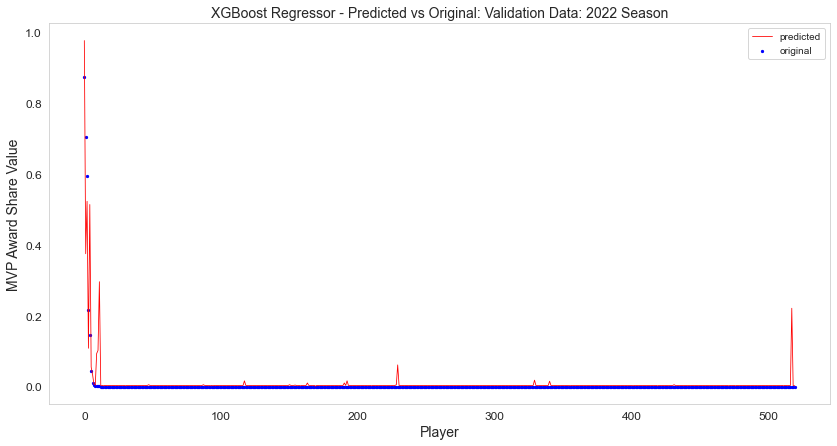

In [69]:
x_ax = range(len(y_val))
plt.scatter(x_ax, y_val, s=5, color="blue", label="original")
plt.plot(x_ax, pred_xgb, lw=0.8, color="red", label="predicted")
plt.legend()
plt.title("XGBoost Regressor - Predicted vs Original: Validation Data: 2022 Season")
plt.xlabel("Player")
plt.ylabel("MVP Award Share Value")
plt.show()

#### Cat Boosting Regressor <a name='cat_val'></a>

In [70]:
# CatBoost Regressor Predict the model on Validation Data
pred_cat = cat_model.predict(X_val).round(3)
 
# R2, MSE, RMSE scoring
mse = mean_squared_error(y_val, pred_cat)
r2 = round(r2_score(y_val, pred_cat),3)

print("Validation prediction R2: %.4f" %r2)
print("Validation prediction MSE: %.4f" % mse)
print("Validation prediction RMSE: %.4f" % (mse**(1/2.0)))

Validation prediction R2: 0.8390
Validation prediction MSE: 0.0005
Validation prediction RMSE: 0.0227


In [71]:
df_val['mvp_award_share_PRED'] = pred_cat
df_val['was_mpv_rank_PRED'] = df_val.groupby('season')['mvp_award_share_PRED'].rank(method='max',ascending=False)
df_val['was_mpv_rank_PRED'] = df_val['was_mpv_rank_PRED'].astype(int)
pred_output = df_val[['season','player','pos','team_id','was_mvp_TF','award_share','was_mpv_rank','mvp_award_share_PRED','was_mpv_rank_PRED']]
pred_output['was_mpv_rank'] = pred_output['was_mpv_rank'].astype(int)
pred_output.sort_values(by=['mvp_award_share_PRED'], ascending=False).head(10)

,season,player,pos,team_id,was_mvp_TF,award_share,was_mpv_rank,mvp_award_share_PRED,was_mpv_rank_PRED
14263,2022,Nikola Jokić,C,DEN,True,0.875,1,0.708,1
14265,2022,Giannis Antetokounmpo,PF,MIL,False,0.595,3,0.692,2
14264,2022,Joel Embiid,C,PHI,False,0.706,2,0.525,3
14267,2022,Luka Dončić,PG,DAL,False,0.146,5,0.484,4
14274,2022,LeBron James,PF,LAL,False,0.001,12,0.140,5
14780,2022,Trae Young,PG,ATL,False,0.000,520,0.113,6
14272,2022,DeMar DeRozan,PF,CHI,False,0.001,12,0.112,7
14273,2022,Kevin Durant,PF,BRK,False,0.001,12,0.103,8
14266,2022,Devin Booker,SG,PHO,False,0.216,4,0.071,9
14268,2022,Jayson Tatum,SF,BOS,False,0.043,6,0.056,10


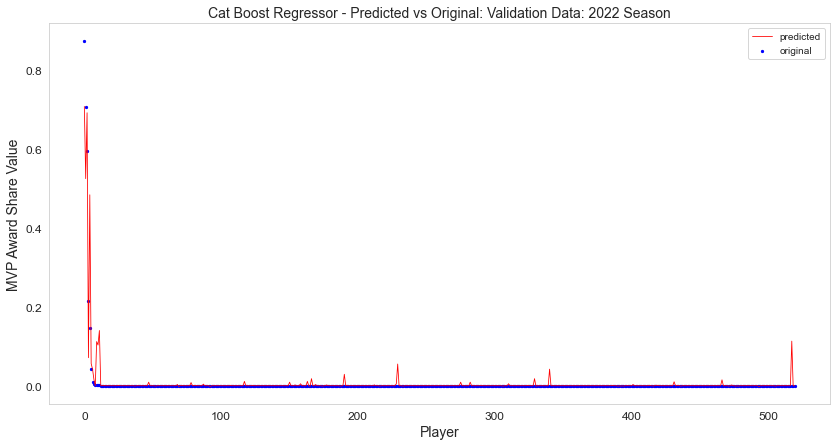

In [72]:
x_ax = range(len(y_val))
plt.scatter(x_ax, y_val, s=5, color="blue", label="original")
plt.plot(x_ax, pred_cat, lw=0.8, color="red", label="predicted")
plt.legend()
plt.title("Cat Boost Regressor - Predicted vs Original: Validation Data: 2022 Season")
plt.xlabel("Player")
plt.ylabel("MVP Award Share Value")
plt.show()

### Model Development and Fit Findings

<div class="alert alert-block alert-warning"> For the 2021 season Extra Tress and Random Foreast performed very close. While XGBoost outperformed both. In the 2022 season Extra Trees and XGBoost has results that were close but in the end XGBoost out performed Extra Trees. The optimal HyperParameters for each model was as such:

- Extra Trees best hyperparameters: {'warm_start': True, 'oob_score': False, 'n_estimators': 800, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 32, 'criterion': 'mse', 'bootstrap': False}

- XGBoost best hyperparameters: {'subsample': 0.5, 'objective': 'reg:squarederror', 'n_estimators': 100, 'min_child_weight': 1, 'max_depth': 3, 'learning_rate': 0.1, 'colsample_bytree': 0.5}

- Random Forest best hyperparameters: {'oob_score': True, 'n_estimators': 50, 'min_samples_split': 2, 'max_features': 5, 'max_depth': 15, 'bootstrap': True}

<a name='conclu'></a>

### Further Model Optimization using Voting Regressor <a name='vote'></a>

Since both Extra Trees, XGBoost and Random Forest yielded very similar performing results employing a Voting Regressor with all 3 might yield the best results.

In [73]:
# Voting Regressor with Random Forest, XGBoost Regressor & Extra Trees

vr = VotingRegressor(estimators=[('rfr', rfc_model), ('xgb', xgb_model), ('etr',etr_model)])
pred_vr = vr.fit(X_train, y_train).predict(X_test).round(3)

# R2, MSE, RMSE scoring
mse = mean_squared_error(y_test, pred_vr)
r2 = round(r2_score(y_test, pred_vr),3)

print("Test Data Regression Model Performance Results: Voting Regressor Model with Random Forest, XGBoost Regressor & Extra Trees")
print("Test data set R2: %.4f" %r2)
print("Test data set MSE: %.4f" % mse)
print("Test data set RMSE: %.4f" % (mse**(1/2.0)))

Test Data Regression Model Performance Results: Voting Regressor Model with Random Forest, XGBoost Regressor & Extra Trees
Test data set R2: 0.7330
Test data set MSE: 0.0008
Test data set RMSE: 0.0291


In [74]:
# Test session review

df_test['mvp_award_share_PRED'] = pred_vr
df_test['was_mpv_rank_PRED'] = df_test.groupby('season')['mvp_award_share_PRED'].rank(method='max',ascending=False)
df_test['was_mpv_rank_PRED'] = df_test['was_mpv_rank_PRED'].astype(int)
pred_output = df_test[['season','player','pos','team_id','was_mvp_TF','award_share','was_mpv_rank','mvp_award_share_PRED','was_mpv_rank_PRED']]
pred_output['was_mpv_rank'] = pred_output['was_mpv_rank'].astype(int)
pred_output.sort_values(by=['mvp_award_share_PRED'], ascending=False).head(10)

,season,player,pos,team_id,was_mvp_TF,award_share,was_mpv_rank,mvp_award_share_PRED,was_mpv_rank_PRED
13760,2021,Nikola Jokić,C,DEN,True,0.961,1,0.674,1
13762,2021,Stephen Curry,PG,GSW,False,0.449,3,0.294,2
13763,2021,Giannis Antetokounmpo,PF,MIL,False,0.345,4,0.256,3
13765,2021,Luka Dončić,PG,DAL,False,0.042,6,0.211,4
13808,2021,Bradley Beal,SG,WAS,False,0.000,503,0.197,5
13761,2021,Joel Embiid,C,PHI,False,0.580,2,0.135,6
13766,2021,Damian Lillard,PG,POR,False,0.038,7,0.131,7
14250,2021,Zion Williamson,PF,NOP,False,0.000,503,0.088,8
14030,2021,Zach LaVine,SG,CHI,False,0.000,503,0.064,9
14260,2021,Trae Young,PG,ATL,False,0.000,503,0.038,10


In [75]:
# Voting Regressor Predict the model on Validation Data
pred_vr = vr.predict(X_val).round(3)
 
# R2, MSE, RMSE scoring
mse = mean_squared_error(y_val, pred_vr)
r2 = round(r2_score(y_val, pred_vr),3)

print("Validation prediction R2: %.4f" %r2)
print("Validation prediction MSE: %.4f" % mse)
print("Validation prediction RMSE: %.4f" % (mse**(1/2.0)))

Validation prediction R2: 0.8140
Validation prediction MSE: 0.0006
Validation prediction RMSE: 0.0245


In [76]:
# Validation session review

df_val['mvp_award_share_PRED'] = pred_vr
df_val['was_mpv_rank_PRED'] = df_val.groupby('season')['mvp_award_share_PRED'].rank(method='max',ascending=False)
df_val['was_mpv_rank_PRED'] = df_val['was_mpv_rank_PRED'].astype(int)
pred_output = df_val[['season','player','pos','team_id','was_mvp_TF','award_share','was_mpv_rank','mvp_award_share_PRED','was_mpv_rank_PRED']]
pred_output['was_mpv_rank'] = pred_output['was_mpv_rank'].astype(int)
pred_output.sort_values(by=['mvp_award_share_PRED'], ascending=False).head(10)

,season,player,pos,team_id,was_mvp_TF,award_share,was_mpv_rank,mvp_award_share_PRED,was_mpv_rank_PRED
14263,2022,Nikola Jokić,C,DEN,True,0.875,1,0.899,1
14265,2022,Giannis Antetokounmpo,PF,MIL,False,0.595,3,0.586,2
14267,2022,Luka Dončić,PG,DAL,False,0.146,5,0.426,3
14264,2022,Joel Embiid,C,PHI,False,0.706,2,0.411,4
14274,2022,LeBron James,PF,LAL,False,0.001,12,0.208,5
14780,2022,Trae Young,PG,ATL,False,0.000,520,0.174,6
14273,2022,Kevin Durant,PF,BRK,False,0.001,12,0.145,7
14272,2022,DeMar DeRozan,PF,CHI,False,0.001,12,0.139,8
14269,2022,Ja Morant,PG,MEM,False,0.010,7,0.064,9
14266,2022,Devin Booker,SG,PHO,False,0.216,4,0.060,10


## Conclusion Statements <a name='con'></a>

#### <div class="alert alert-block alert-success">In reviewing our objectives with model performance in Test and Validation, as well as implementing a Voting Regressor with the 3 top performing models, the model that performed the best was the XGBoost Regressor. With this said the final model we would implement would be XGBoost Regressor with the following hyperparameters: {'subsample': 0.7, 'objective': 'reg:squarederror', 'n_estimators': 100, 'min_child_weight': 5, 'max_depth': 3, 'learning_rate': 0.1, 'colsample_bytree': 0.5}

#### Model Feature Influence & Analysis: which feature influence the model and how<a name='featinflu'></a>

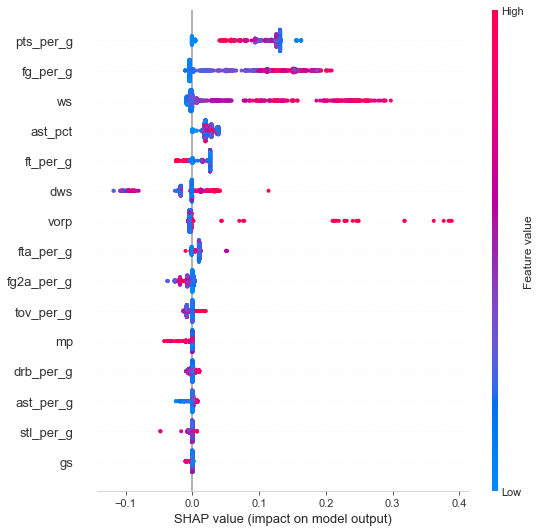

In [77]:
#!pip install shap
import shap

df_shap = df[(df.season >= 2021)]

y = df_shap['award_share']
X = df_shap[['ws',
 'vorp',
 'ft_per_g',
 'fta_per_g',
 'gs',
 'pts_per_g',
 'fg_per_g',
 'fg2a_per_g',
 'ast_per_g',
 'dws',
 'drb_per_g',
 'tov_per_g',
 'mp',
 'stl_per_g',
 'ast_pct']]

#explainer = shap.Explainer(xgb_model.predict, X)
#shap_values = explainer(X)

#shap.plots.beeswarm(shap_values, max_display=20)

# explain all the predictions in the test & validation set
ex = shap.TreeExplainer(xgb_model)
shap_values = ex.shap_values(X)
shap.summary_plot(shap_values, X)
plt.show()

The top 5 features that impact the model are as follows:

- Point per Game (pts_per_g): the lower the points per game the less likely that player will be the MVP
- Win Shares (ws): an estimate of the number of wins contributed by a player. The higher the WS the more likely that player will be the MVP
- Field Goals per Game (fga_per_g): Field Goals (includes both 2-point field goals and 3-point field goals). The higher the FGA_per_G the more likely that player will be the MVP
- Defensive Win Shares (dws): a player statistic that attributes credit to players based on their ability to prevent opposing teams from scoring. The higher the DWS the more likely that player will be the MVP.
-  Assist Percentage (ast_pct): Assist percentage is an estimate of the percentage of teammate field goals a player assisted while he was on the floor. \The higher the ast_pct the more likely that player will be the MVP

#### Learning Curve Plot<a name='lc'></a>

In [78]:
train_sizes, train_scores, test_scores = learning_curve(xgb.XGBRegressor(subsample = 0.5, objective = 'reg:squarederror', n_estimators= 100, min_child_weight= 1, max_depth=3, learning_rate=0.1, colsample_bytree=0.5), X=X_train, y=y_train,
                                                       cv=5, train_sizes=np.linspace(0.01, 1.0, 5),
                                                     n_jobs=-1,scoring = 'neg_root_mean_squared_error',random_state=42)

In [79]:
# Calculate training and test mean and std
 
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

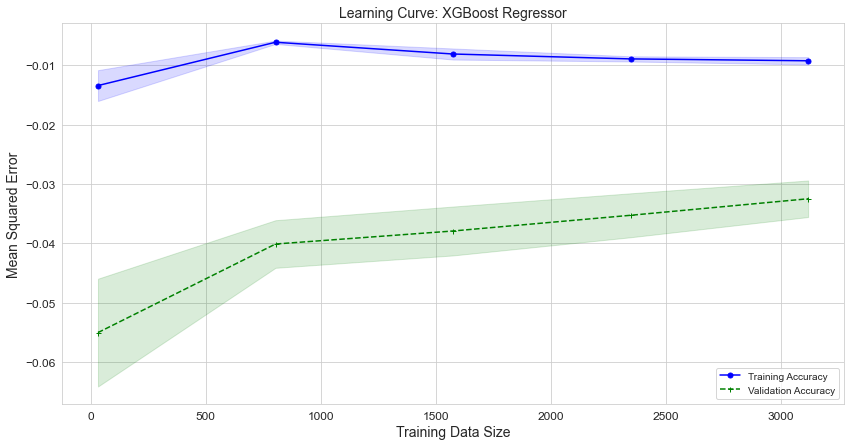

In [80]:
# Plot the learning curve
 
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', marker='+', markersize=5, linestyle='--', label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.title('Learning Curve: XGBoost Regressor')
plt.xlabel('Training Data Size')
plt.ylabel('Mean Squared Error')
plt.grid()
plt.legend(loc='lower right')
plt.show()